# Make panels for:

- age vs bio age
- sylable expression patterns
- r2 heldout performance
- behavior distance matrices

In [1]:
import numpy as np
import pandas as pd
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
from aging.behavior.bio_age_model import fit_model, masked_xval, stratified_xval
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
)
from sklearn.preprocessing import OneHotEncoder
from tqdm.auto import tqdm
from itertools import product
from toolz import valmap, keyfilter, pluck, reduce

import colorcet as cc
from sklearn.preprocessing import LabelEncoder

from operator import or_

from aging.behavior.bio_age_model import model_fun_v5, get_biological_age
from toolz import dissoc

from aging.behavior.bio_age_model import (
    model_setup,
    model_fun_v2,
    compute_concentrations,
    expected_counts,
    concentration_interpolation,
    create_masks,
    compute_heldout_r2,
)
from sklearn.metrics import r2_score

In [2]:
format_plots()
c = PlotConfig()
saver = save_factory(c.save_path / "bio_age_model", tight_layout=False)

In [3]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()


def quantile(n):
    def percentile_(x):
        return x.quantile(n)
    percentile_.__name__ = 'q_{:0.02f}'.format(n)
    return percentile_

In [4]:
to_remove = [
    "e4f1076b",
    "3867c517",
    "60e82cb4",
]

In [5]:
df = pd.read_parquet(
    # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_relabeled_counts_matrix_v00.parquet"
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)
mask = df.index.get_level_values("age") < 100
df = df[mask].copy()

masks = []
for uuid in to_remove:
    m = df.reset_index()['uuid'].str.startswith(uuid)
    masks.append(m)
mask = np.array(reduce(or_, masks), dtype=bool)
df = df[~mask].copy()

# filter for syllables used a lot and ones that have high variance across age
age_cut = pd.cut(df.index.get_level_values('age'), 18)
avg_age_usages = df.groupby(age_cut, observed=True).mean()
syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
print(syll_mask.sum(), 'syllables')

df = df.loc[:, syll_mask].copy()

size_df = pd.read_parquet(
    # '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_mouse_area_df_v00.parquet'
    '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
)
mask = size_df.index.get_level_values("age") < 100
size_df = size_df[mask].copy()
age_cut = pd.cut(size_df.index.get_level_values('age'), 19)

size_df.loc[size_df['quant_0.5'] == 0, 'quant_0.5'] = np.nan
sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)

sizes_col = zscore(sizes_col.groupby(age_cut, observed=True).transform(demean))
sizes_col = sizes_col.fillna(0)
sizes_col = sizes_col.loc[df.index]

# make sure df matches sizes
df = df.loc[sizes_col.index]

# subsample the dataset
cut, bins = pd.cut(df.index.get_level_values('age'), 32, retbins=True)
tmp_df = df.groupby(['mouse', cut], observed=True).first()
mid_age = [round(v.left, 2) for v in tmp_df.index.get_level_values(1)]
tmp_df['age'] = mid_age
tmp_df = tmp_df.set_index('age', append=True).droplevel(1)

sizes_col = sizes_col.groupby(['mouse', cut], observed=True).first()
sizes_col = sizes_col.reset_index()
sizes_col['age'] = [round(v.left, 2) for v in sizes_col['level_1']]
sizes_col = sizes_col.drop(columns=['level_1']).set_index(['mouse', 'age'])['quant_0.5']
sizes_col = sizes_col.loc[tmp_df.index]

age = jnp.array(tmp_df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(tmp_df.astype(float))
# age = jnp.array(df.index.get_level_values("age"))
# syllable_counts_jax = jnp.array(df.astype(float))

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
mouse_ids = label_encoder.fit_transform(
    sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
).T

49 syllables


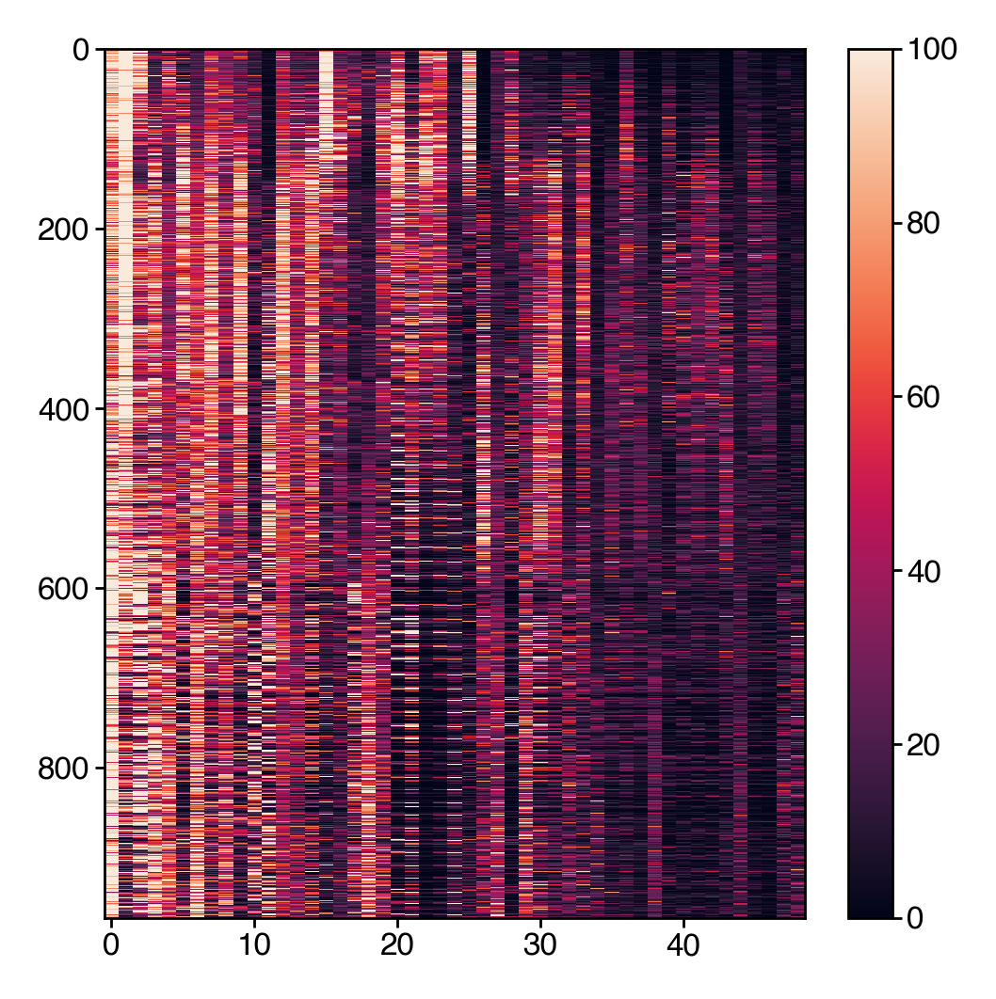

In [6]:
# plt.imshow(tmp_df, aspect='auto', interpolation='none', vmax=100)
plt.imshow(df, aspect='auto', interpolation='none', vmax=100)
plt.colorbar()

In [7]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 11,  # weeks  - chosen from optimization
    # "bio_params_sd": 1000,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,  # set based on ontogeny
    "n_size_splines": 5,
    "n_development_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
}

## Cross-validation

### Age SD

In [8]:
keep_keys = ['heldout_ll', 'heldout_r2_total_v2', 'heldout_r2_total_v3', 'true_ages', 'bio_ages', 'loss']
outs = []

for age_sd in tqdm(np.linspace(1, 20, 15)):
    age_sd = float(age_sd)

    hypparams["age_sd"] = age_sd
    try:
        tmp = masked_xval(features, hypparams, 5, n_repeats=3, disable_tqdm=True)
        tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
        for k, v in tmp.items():
            outs.append({
                "repeat": k,
                "age_sd": age_sd,
                **v
            })
    except ValueError:
        continue
outs_df = pd.DataFrame(outs)

  0%|          | 0/15 [00:00<?, ?it/s]

In [9]:
# outs_df = pd.DataFrame(outs)

In [10]:
optimal_sd = outs_df.groupby('age_sd')['heldout_ll'].mean().idxmax()
optimal_sd

5.071428571428571

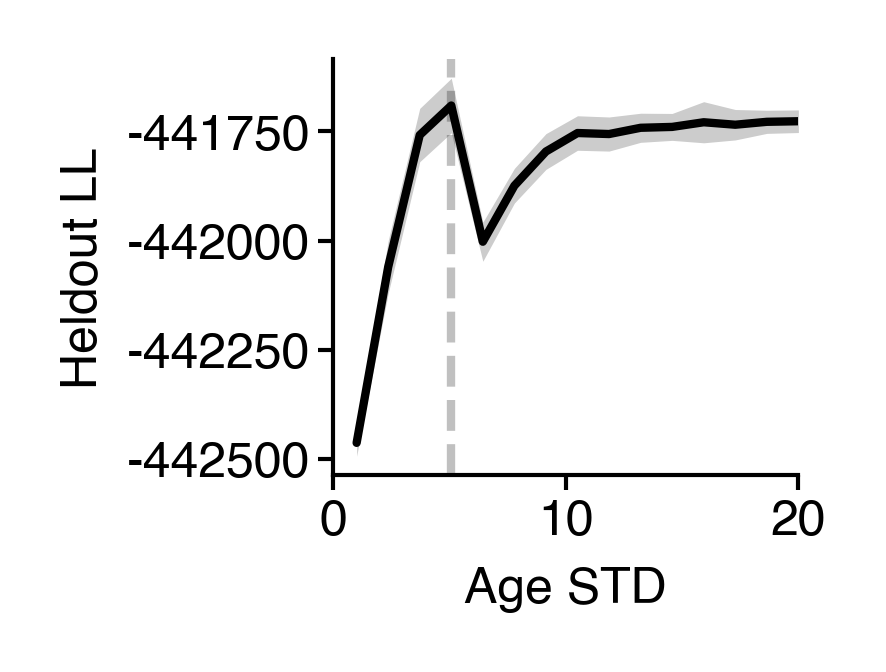

In [11]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=outs_df,
    x="age_sd",
    y="heldout_ll",
    errorbar="se",
    color="k",
    err_kws=dict(lw=0),
)
ax.set(xlabel="Age STD", ylabel="Heldout LL", xlim=(0, 20))
ax.axvline(optimal_sd, ls="--", color="silver", zorder=-1)
sns.despine()
# saver(fig, 'longtogeny-age_sd-heldout-ll-lineplot');

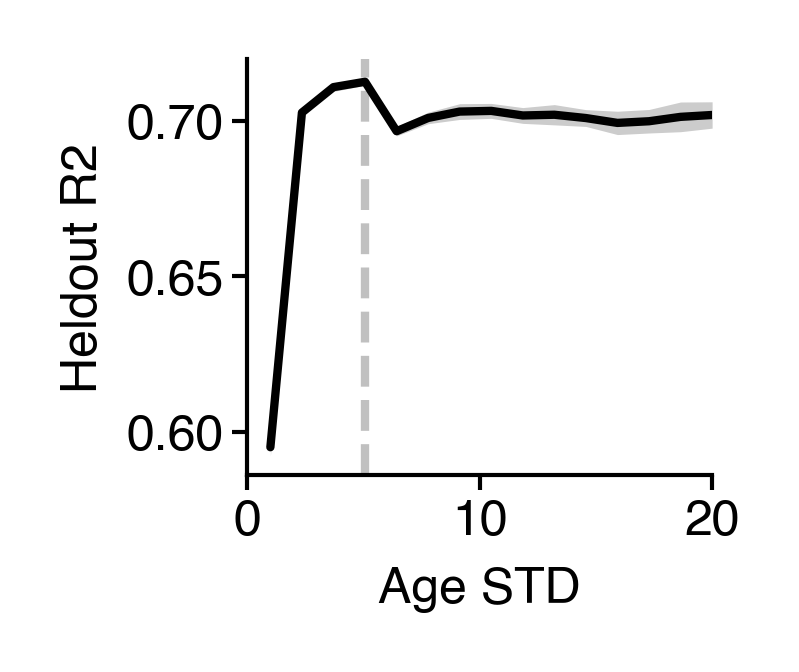

In [12]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=outs_df,
    x="age_sd",
    y="heldout_r2_total_v3",
    errorbar="se",
    color="k",
    err_kws=dict(lw=0),
)
ax.set(xlabel="Age STD", ylabel="Heldout R2", xlim=(0, 20))
ax.axvline(optimal_sd, ls="--", color="silver", zorder=-1)
sns.despine()
# saver(fig, "longtogeny-age_sd-heldout-r2-lineplot");

## Compare to linear model

In [13]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 5.0,  # weeks
    # "bio_params_sd": 1000,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_development_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
}

In [14]:
mdl5 = masked_xval(features, hypparams, 5, n_repeats=20)
mdl0 = masked_xval(features, hypparams, 0, n_repeats=20)

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [15]:
r2_5 = list(pluck('heldout_r2_total_v3', mdl5.values()))
r2_0 = list(pluck('heldout_r2_total', mdl0.values()))

/tmp/ipykernel_8689/4003754114.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 15.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


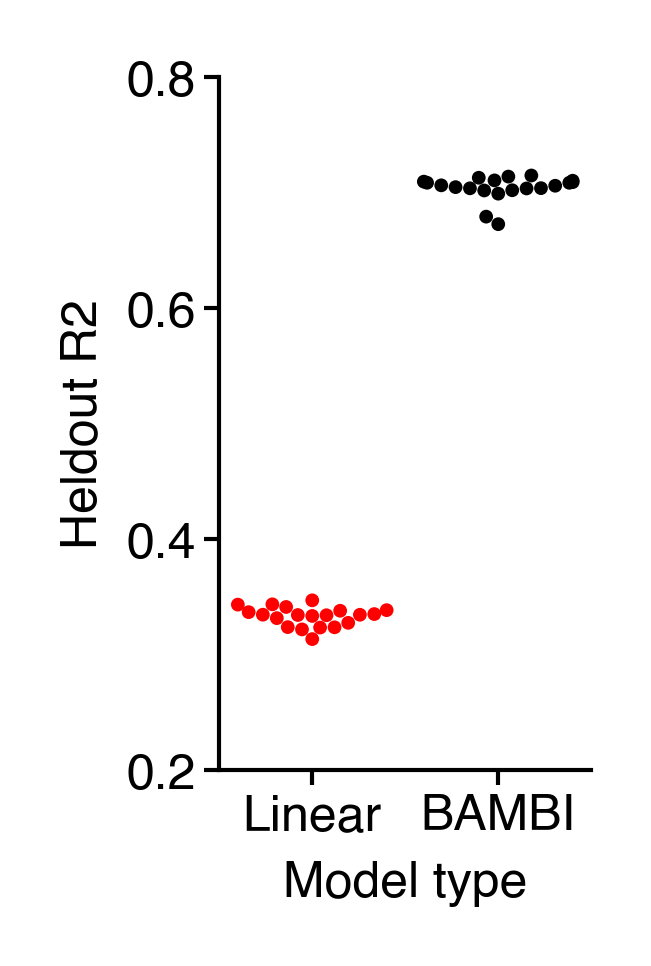

In [16]:
fig = figure(0.8, 1.5)
ax = sns.swarmplot(data=[r2_0, r2_5], palette=["r", "k"], size=1.65)
ax.set(
    xticklabels=["Linear", "BAMBI"],
    xlabel="Model type",
    ylabel="Heldout R2",
    ylim=(0.2, 0.8),
)
# plt.xticks(rotation=90)
sns.despine()
saver(fig, "longtogeny-heldout-r2-model-comparison");

## Visualize syllable count predictions

Supply all the data for this section

In [17]:
df = pd.read_parquet(
    # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_relabeled_counts_matrix_v00.parquet"
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)
mask = df.index.get_level_values("age") < 100
df = df[mask].copy()

masks = []
for uuid in to_remove:
    m = df.reset_index()['uuid'].str.startswith(uuid)
    masks.append(m)
mask = np.array(reduce(or_, masks), dtype=bool)
df = df[~mask].copy()

# filter for syllables used a lot and ones that have high variance across age
age_cut = pd.cut(df.index.get_level_values('age'), 18)
avg_age_usages = df.groupby(age_cut, observed=True).mean()
syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
print(syll_mask.sum(), 'syllables')

df = df.loc[:, syll_mask].copy()

size_df = pd.read_parquet(
    # '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_mouse_area_df_v00.parquet'
    '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
)
mask = size_df.index.get_level_values("age") < 100
size_df = size_df[mask].copy()
age_cut = pd.cut(size_df.index.get_level_values('age'), 19)

size_df.loc[size_df['quant_0.5'] == 0, 'quant_0.5'] = np.nan
sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)

sizes_col = zscore(sizes_col.groupby(age_cut, observed=True).transform(demean))
sizes_col = sizes_col.fillna(0)
sizes_col = sizes_col.loc[df.index]

# make sure df matches sizes
df = df.loc[sizes_col.index]

# subsample the dataset
cut, bins = pd.cut(df.index.get_level_values('age'), 32, retbins=True)
tmp_df = df.groupby(['mouse', cut], observed=True).first()
mid_age = [round(v.left, 2) for v in tmp_df.index.get_level_values(1)]
tmp_df['age'] = mid_age
tmp_df = tmp_df.set_index('age', append=True).droplevel(1)

sizes_col = sizes_col.groupby(['mouse', cut], observed=True).first()
sizes_col = sizes_col.reset_index()
sizes_col['age'] = [round(v.left, 2) for v in sizes_col['level_1']]
sizes_col = sizes_col.drop(columns=['level_1']).set_index(['mouse', 'age'])['quant_0.5']
sizes_col = sizes_col.loc[tmp_df.index]

age = jnp.array(tmp_df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(tmp_df.astype(float))
# age = jnp.array(df.index.get_level_values("age"))
# syllable_counts_jax = jnp.array(df.astype(float))

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
mouse_ids = label_encoder.fit_transform(
    sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
).T

49 syllables


In [18]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 5.0,  # weeks
    # "bio_params_sd": 1000,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_development_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
}

In [19]:
mdl = fit_model(features, hypparams, 5)

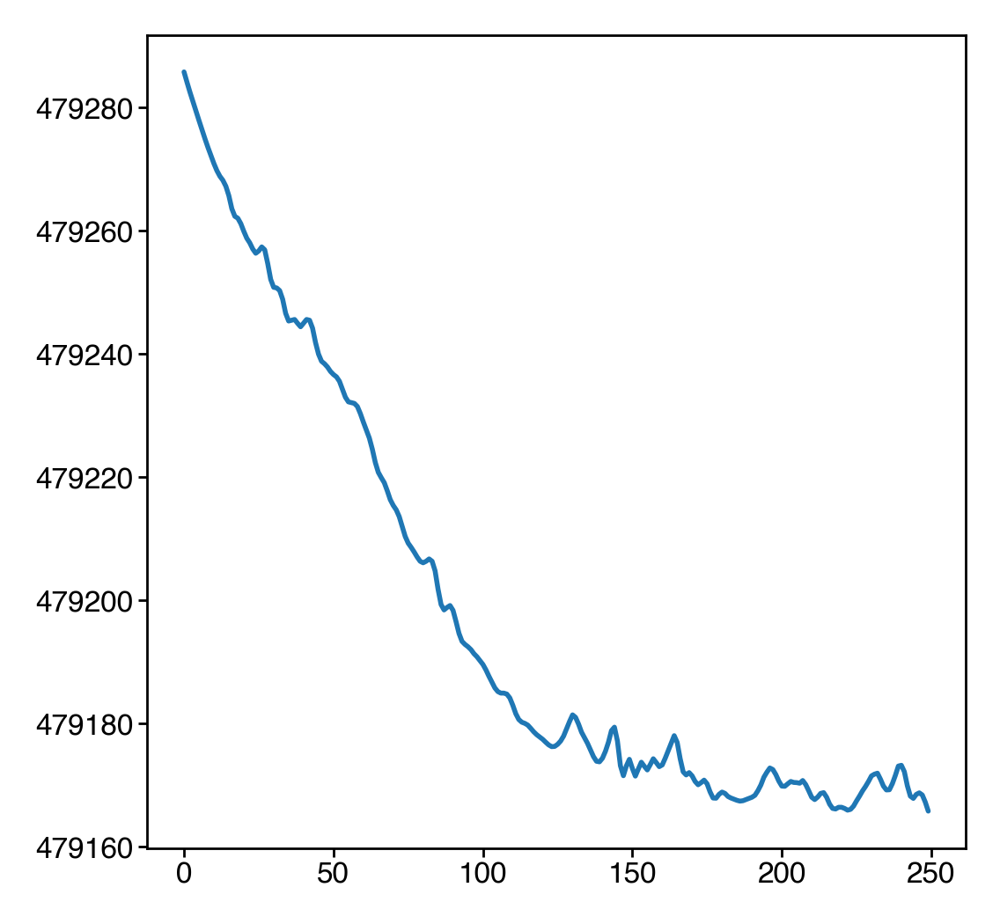

In [20]:
plt.plot(mdl['loss'][100:])

In [21]:
mdl.keys()

dict_keys(['params', 'heldout_ll', 'loss', 'bio_ages', 'true_ages', 'init_components', 'concentrations', 'concentration_components', 'predicted_counts', 'counts', 'r2_total', 'r2_each'])

In [22]:
# labels = LabelEncoder().fit_transform(df.index.get_level_values('mouse'))
labels = LabelEncoder().fit_transform(tmp_df.index.get_level_values('mouse'))

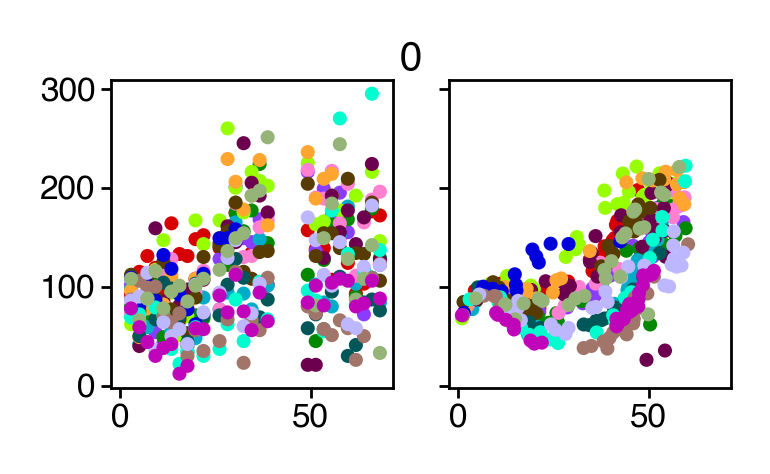

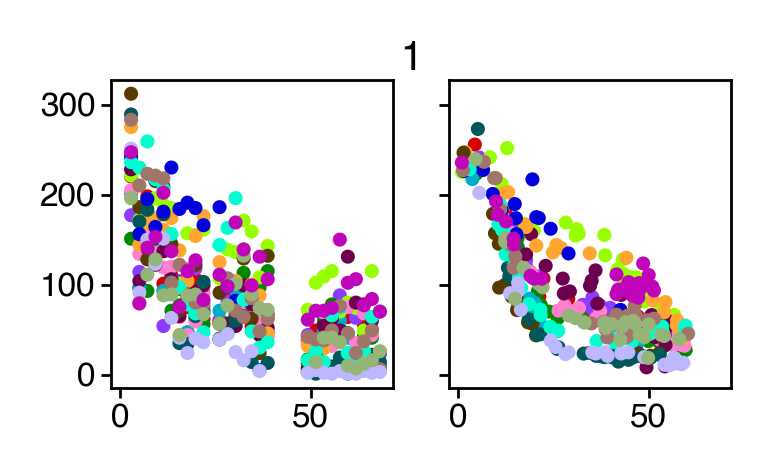

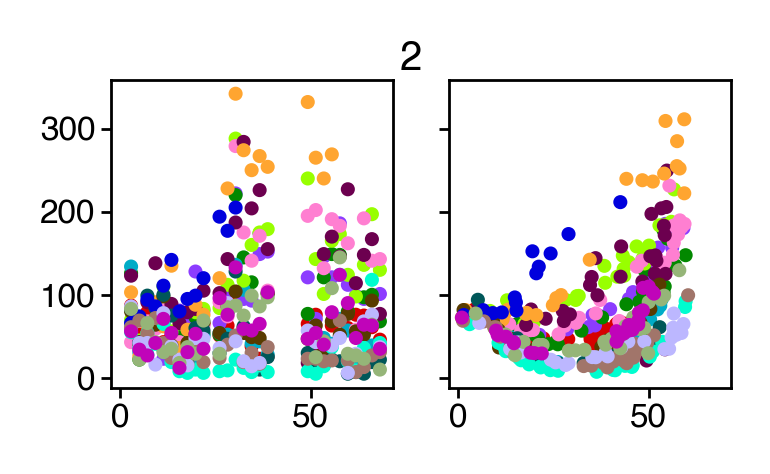

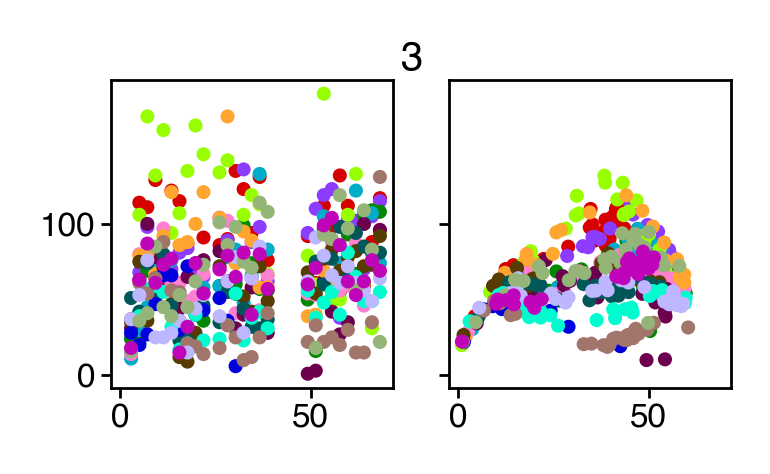

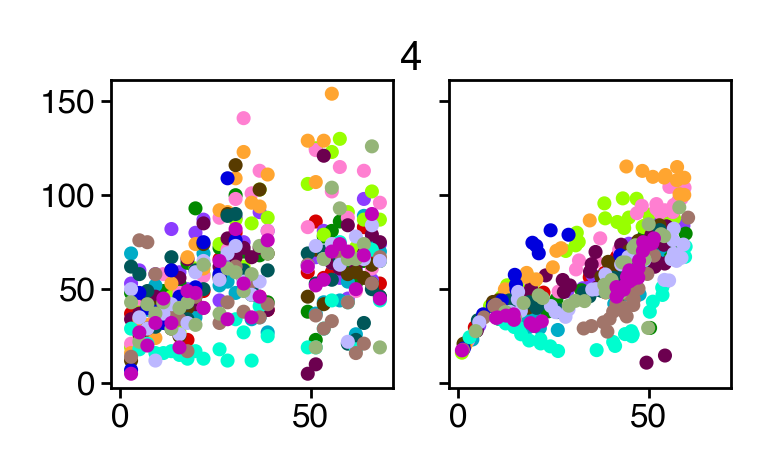

...

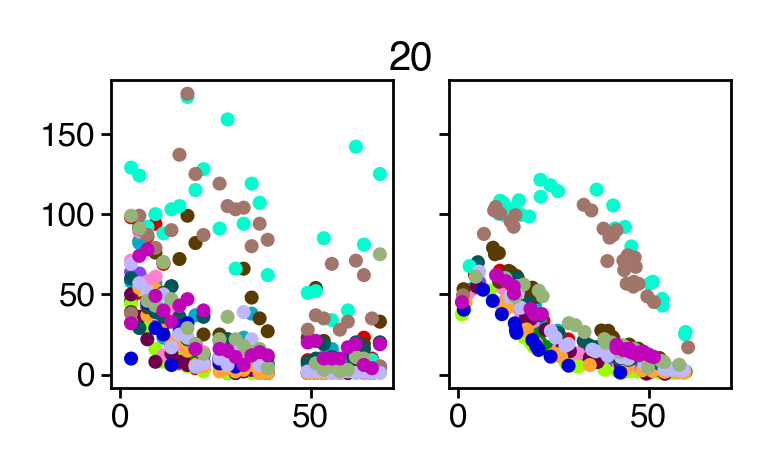

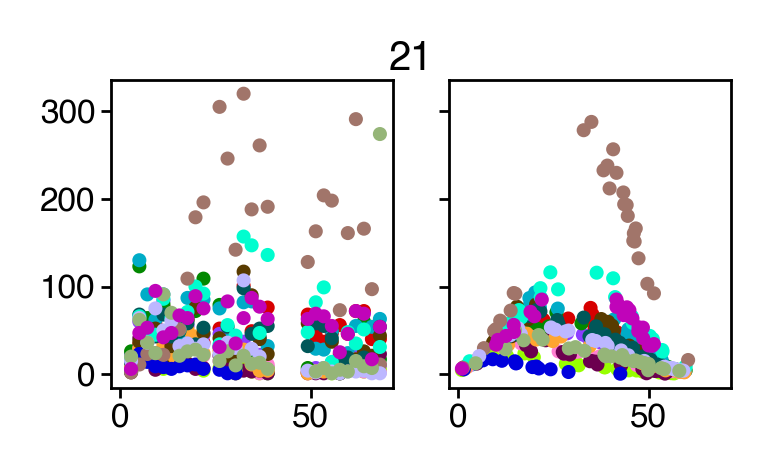

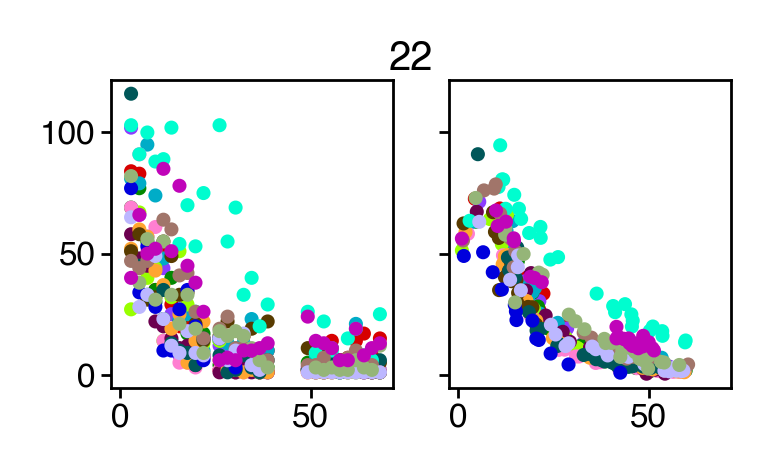

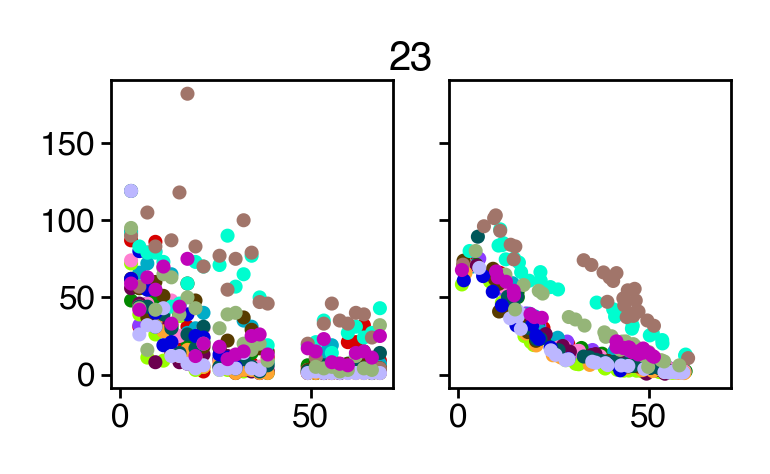

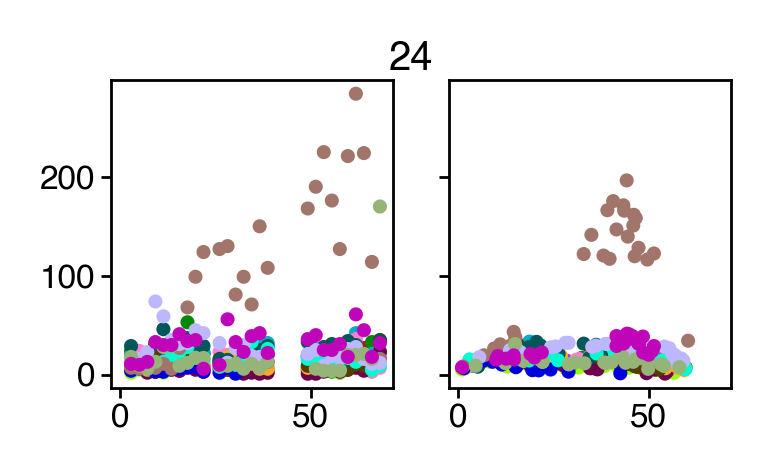

In [23]:
for syll in range(25):
    fig, ax = plt.subplots(1, 2, figsize=(2, 1), sharey=True, sharex=True)
    fig.suptitle(syll)
    ax[0].scatter(mdl['true_ages'], mdl['counts'][:, syll], s=3, c=labels, cmap=cc.cm.glasbey, vmax=256)
    # ax[1].scatter(mdl['bio_ages'], mdl['counts'][:, syll], s=3, c=labels, cmap=cc.cm.glasbey, vmax=256)
    ax[1].scatter(mdl['bio_ages'], mdl['predicted_counts'][:, syll], s=3, c=labels, cmap=cc.cm.glasbey, vmax=256)

In [24]:
example_mice = [11, 7, 0, 10]

mask = []
for m in example_mice:
    mask.append(labels == m)
mask = reduce(or_, mask)

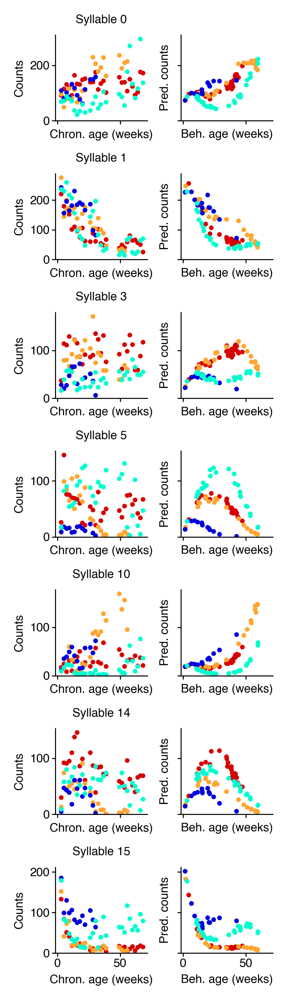

In [25]:
sylls = [0, 1, 3, 5, 10, 14, 15]
fig, ax = plt.subplots(len(sylls), 2, figsize=(2, len(sylls)), sharex=True)

true_age = mdl["true_ages"][mask]
bio_age = mdl["bio_ages"][mask]
counts = mdl["counts"][mask]
pred_counts = mdl["predicted_counts"][mask]

for a, syll in zip(ax, sylls):
    max_counts = max([counts[:, syll].max(), pred_counts[:, syll].max()]) * 1.05
    a[0].scatter(true_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[1].scatter(bio_age, pred_counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[0].set(title=f"Syllable {syll}", ylabel="Counts", xlabel="Chron. age (weeks)", ylim=(0, max_counts))
    a[1].set(ylabel="Pred. counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])
sns.despine()
fig.tight_layout()
# saver(fig, "longtogeny-true-vs-predicted-counts");

In [26]:
def make_plot(age_df, width, height, hue_order=None):
    boundaries = np.arange(age_df["labels"].max() + 2) - 0.5
    fig = figure(width, height)
    if hue_order is None:
        pal = cc.glasbey[: age_df["labels"].max() + 1]
    else:
        pal = [cc.glasbey[hue] for hue in hue_order]
    ax = sns.lineplot(
        data=age_df,
        x="true_ages",
        y="bio_ages",
        hue="labels",
        palette=pal,
        hue_order=hue_order,
        legend=False,
        zorder=-1,
        lw=0.25,
    )
    if hue_order is not None:
        age_df = age_df[age_df['labels'].isin(hue_order)]
    im = ax.scatter(
        age_df["true_ages"],
        age_df["bio_ages"],
        c=age_df["labels"],
        cmap=cc.cm.glasbey,
        vmin=0,
        vmax=256,
        s=2.5,
    )
    cb = fig.colorbar(
        mappable=im,
        boundaries=boundaries,
        ax=ax,
        label="Mouse ID",
    )
    cb.set_ticks(range(0, 16, 2))
    add_identity(ax, c="k", ls="--", zorder=-2)
    ax.set(
        xlabel="Chronological age (weeks)",
        ylabel="Behavioral age (weeks)",
        aspect="equal",
        ylim=(0, 72),
        xlim=(0, 72),
    )
    sns.despine()
    return fig

In [27]:
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=labels),
)

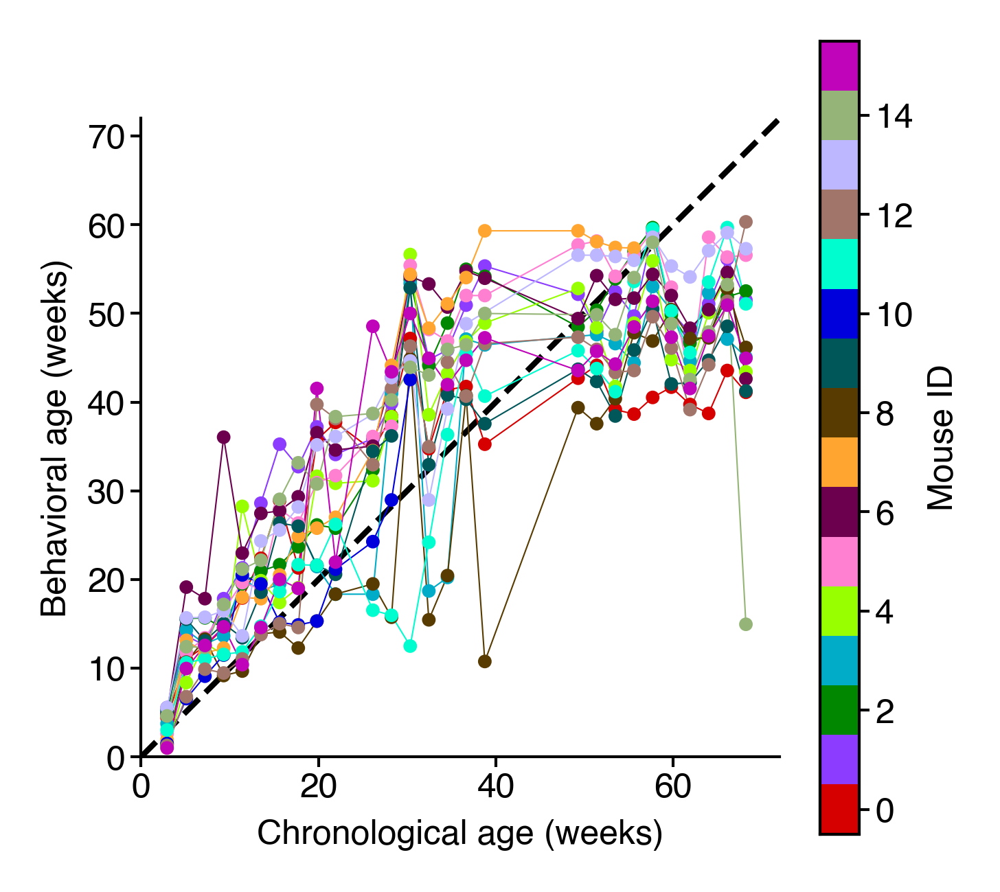

In [28]:
fig = make_plot(age_df, 2.5, 2.5)
# saver(fig, "longtogeny-chron-vs-beh-age");

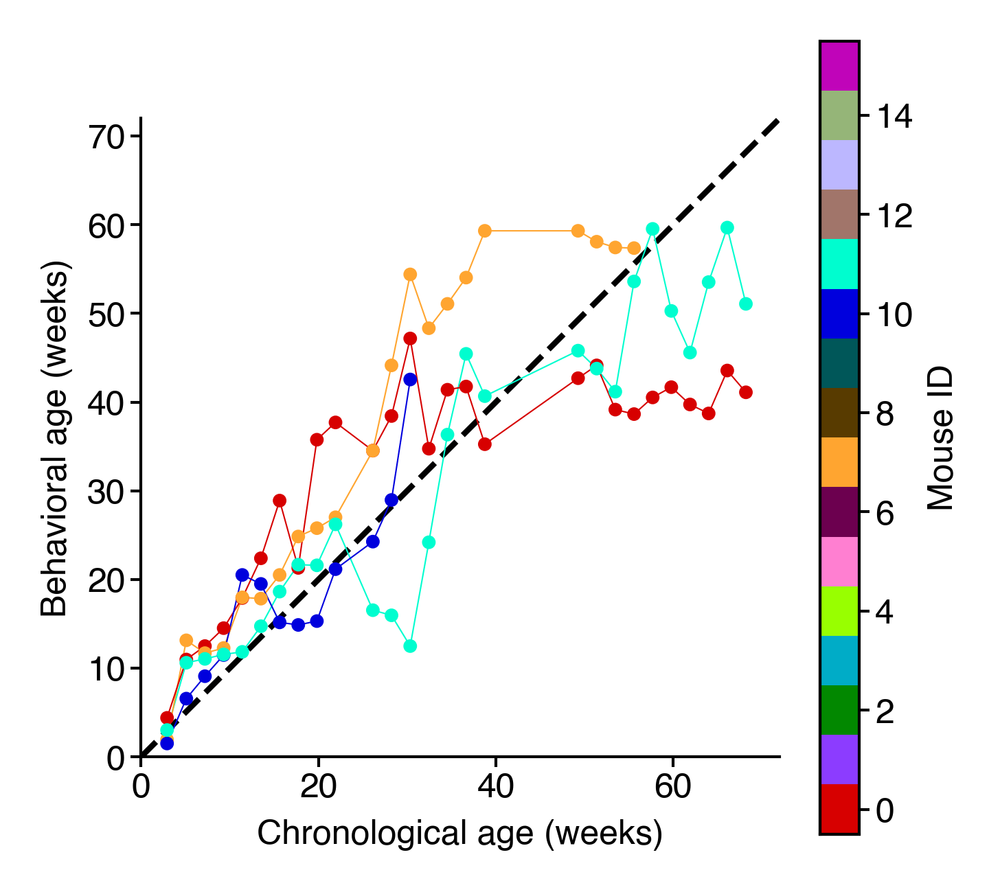

In [29]:
fig = make_plot(age_df, 2.5, 2.5, hue_order=example_mice)
# saver(fig, "longtogeny-chron-vs-beh-age-examples");

## Re-sorted behavioral distance matrices

In [30]:
from scipy.spatial.distance import pdist, squareform

In [31]:
df = pd.read_parquet(
    # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_relabeled_counts_matrix_v00.parquet"
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)
mask = df.index.get_level_values("age") < 100
df = df[mask].copy()

masks = []
for uuid in to_remove:
    m = df.reset_index()['uuid'].str.startswith(uuid)
    masks.append(m)
mask = np.array(reduce(or_, masks), dtype=bool)
df = df[~mask].copy()

# filter for syllables used a lot and ones that have high variance across age
age_cut = pd.cut(df.index.get_level_values('age'), 18)
avg_age_usages = df.groupby(age_cut, observed=True).mean()
syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
print(syll_mask.sum(), 'syllables')

df = df.loc[:, syll_mask].copy()

size_df = pd.read_parquet(
    # '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_mouse_area_df_v00.parquet'
    '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
)
mask = size_df.index.get_level_values("age") < 100
size_df = size_df[mask].copy()
age_cut = pd.cut(size_df.index.get_level_values('age'), 19)

size_df.loc[size_df['quant_0.5'] == 0, 'quant_0.5'] = np.nan
sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)

sizes_col = zscore(sizes_col.groupby(age_cut, observed=True).transform(demean))
sizes_col = sizes_col.fillna(0)
sizes_col = sizes_col.loc[df.index]

# make sure df matches sizes
df = df.loc[sizes_col.index]

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
mouse_ids = label_encoder.fit_transform(
    sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
).T

49 syllables


In [32]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 5.0,  # weeks
    # "bio_params_sd": 1000,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_development_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
}

In [33]:
mdl = fit_model(features, hypparams, 5)

In [34]:
df_copy = df.copy()
# df_copy = tmp_df.copy()
df_copy['beh_age'] = mdl['bio_ages']
df_copy = df_copy.set_index('beh_age', append=True)
df_copy.to_parquet('/n/scratch/users/w/wg41/bio-age-model/longtogeny-behavioral-age.parquet')

Text(0, 0.5, 'Session (sorted by chron. age)')

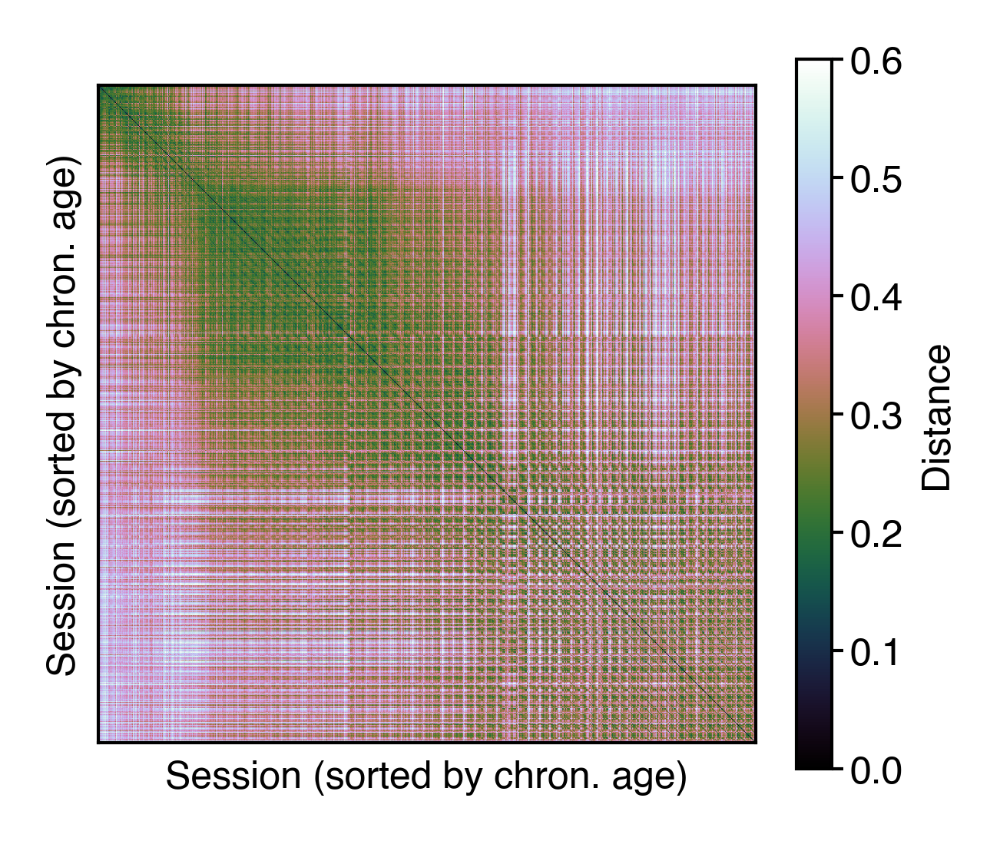

In [35]:
fig = figure(2.3, 2)
d = pdist(df.sort_index(level='age'), metric='jensenshannon')
d = squareform(d)
plt.imshow(d, cmap='cubehelix', vmax=0.6)
plt.colorbar(label="Distance")
plt.xticks([])
plt.yticks([])
plt.xlabel('Session (sorted by chron. age)')
plt.ylabel('Session (sorted by chron. age)')
# saver(fig, 'longtogeny-chron-age-distance-matrix');

Text(0, 0.5, 'Session (sorted by beh. age)')

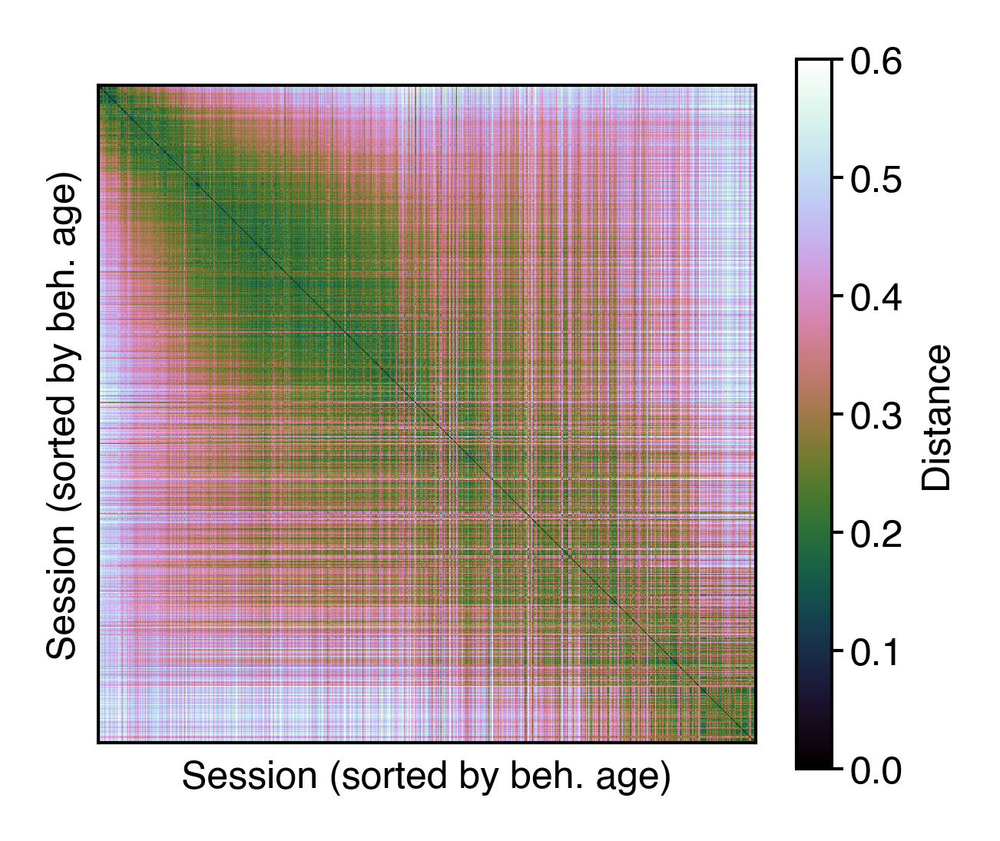

In [36]:
fig = figure(2.3, 2)
d = pdist(df_copy.sort_index(level='beh_age'), metric='jensenshannon')
d = squareform(d)
plt.imshow(d, cmap='cubehelix', vmax=0.6)
plt.colorbar(label="Distance")
plt.xticks([])
plt.yticks([])
plt.xlabel('Session (sorted by beh. age)')
plt.ylabel('Session (sorted by beh. age)')
# saver(fig, 'longtogeny-beh-age-distance-matrix');

In [37]:
_labels = LabelEncoder().fit_transform(df.index.get_level_values('mouse'))
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=_labels),
)

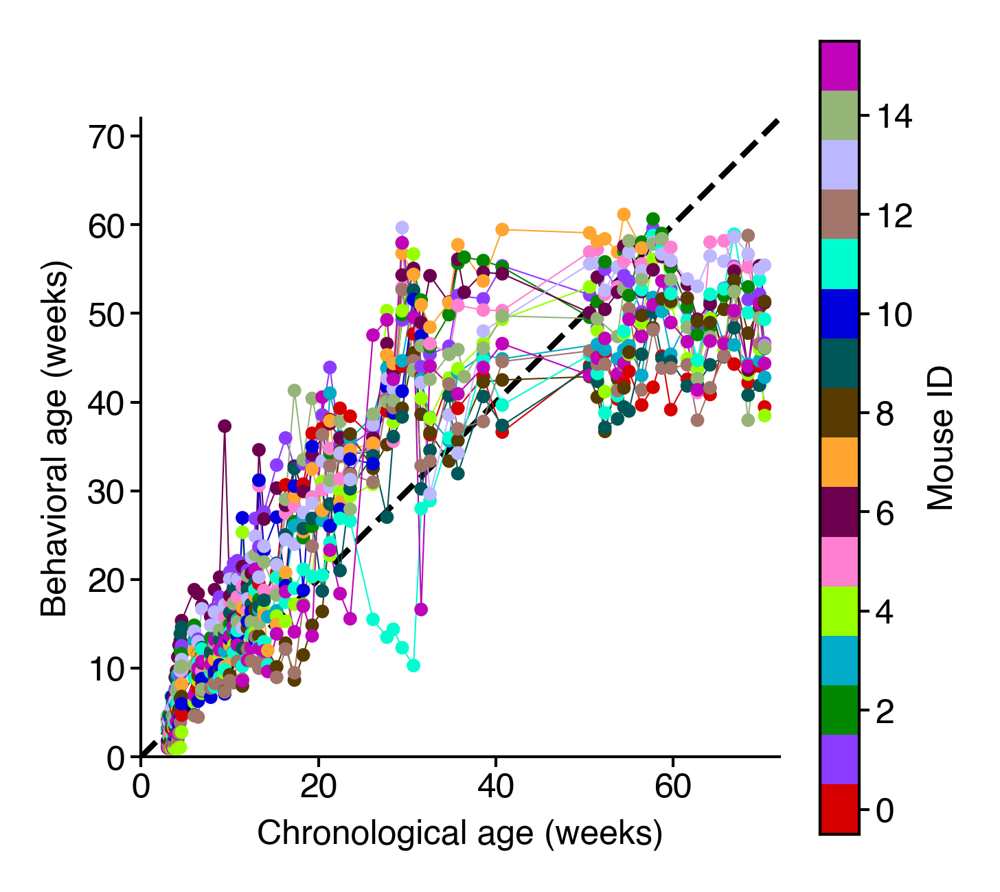

In [38]:
fig = make_plot(age_df, 2.5, 2.5)
# saver(fig, "longtogeny-chron-vs-beh-age-all-timepoints");

## Development component

In [39]:
list(mdl['params'])

['bio_basis_weights', 'development_weights', 'individual_biases', 'size_slope']

In [40]:
x = mdl['params']['development_weights']
dev = (x @ mdl['init_components'].bases['development']).squeeze()

In [41]:
comps = mdl['init_components']

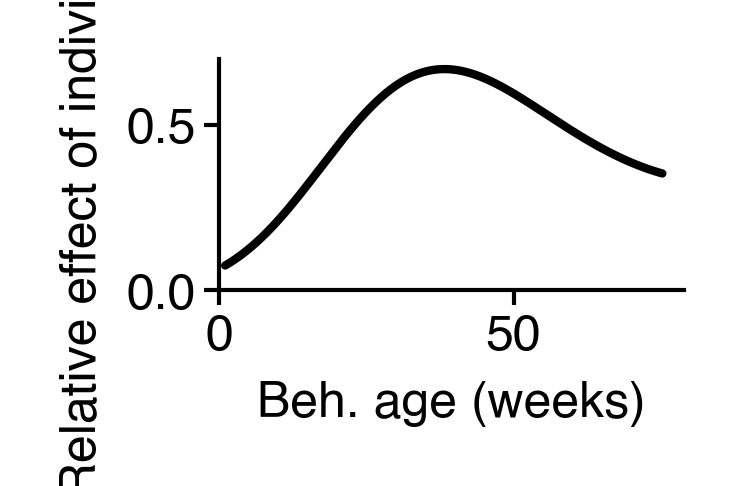

In [42]:
dev = np.exp(dev)
# dev = dev - dev.min()
# dev = dev / dev.max()

fig = figure(1, 0.5)
plt.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, None)
plt.ylim(0, None)
plt.xlabel("Beh. age (weeks)")
plt.ylabel("Relative effect of individuality")
sns.despine()
# saver(fig, "longtogeny-effect-of-individuality");

## Relative influences

In [86]:
df = pd.read_parquet(
    # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_relabeled_counts_matrix_v00.parquet"
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)
mask = df.index.get_level_values("age") < 100
df = df[mask].copy()

masks = []
for uuid in to_remove:
    m = df.reset_index()['uuid'].str.startswith(uuid)
    masks.append(m)
mask = np.array(reduce(or_, masks), dtype=bool)
df = df[~mask].copy()

# filter for syllables used a lot and ones that have high variance across age
age_cut = pd.cut(df.index.get_level_values('age'), 18)
avg_age_usages = df.groupby(age_cut, observed=True).mean()
syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
print(syll_mask.sum(), 'syllables')

df = df.loc[:, syll_mask].copy()

size_df = pd.read_parquet(
    # '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_mouse_area_df_v00.parquet'
    '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
)
mask = size_df.index.get_level_values("age") < 100
size_df = size_df[mask].copy()
age_cut = pd.cut(size_df.index.get_level_values('age'), 19)

size_df.loc[size_df['quant_0.5'] == 0, 'quant_0.5'] = np.nan
sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)

sizes_col = zscore(sizes_col.groupby(age_cut, observed=True).transform(demean))
sizes_col = sizes_col.fillna(0)
sizes_col = sizes_col.loc[df.index]

# make sure df matches sizes
df = df.loc[sizes_col.index]

# subsample the dataset
cut, bins = pd.cut(df.index.get_level_values('age'), 32, retbins=True)
tmp_df = df.groupby(['mouse', cut], observed=True).first()
mid_age = [round(v.left, 2) for v in tmp_df.index.get_level_values(1)]
tmp_df['age'] = mid_age
tmp_df = tmp_df.set_index('age', append=True).droplevel(1)

sizes_col = sizes_col.groupby(['mouse', cut], observed=True).first()
sizes_col = sizes_col.reset_index()
sizes_col['age'] = [round(v.left, 2) for v in sizes_col['level_1']]
sizes_col = sizes_col.drop(columns=['level_1']).set_index(['mouse', 'age'])['quant_0.5']
sizes_col = sizes_col.loc[tmp_df.index]

age = jnp.array(tmp_df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(tmp_df.astype(float))
# age = jnp.array(df.index.get_level_values("age"))
# syllable_counts_jax = jnp.array(df.astype(float))

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
mouse_ids = label_encoder.fit_transform(
    sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
).T

49 syllables


In [87]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 5.0,  # weeks
    # "bio_params_sd": 1000,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_development_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
}

In [88]:
mdl = fit_model(features, hypparams, 5)

In [89]:
list(mdl['concentration_components'])

['bio', 'size', 'indiv', 'indiv_scale']

In [90]:
conc_c = mdl['concentration_components']
indiv_components = conc_c['indiv'] * conc_c['indiv_scale'][None, :, None]

total = (
    np.abs(conc_c["bio"][..., None])
    + np.abs(indiv_components)
    + np.abs(conc_c["size"][:, None, :])
)

In [91]:
init_c = mdl['init_components']
log_probs = model_fun_v5(mdl['params'], init_c.bases, init_c.age_samples, init_c.true_age, features['counts'], dissoc(hypparams, "mask"))
inds = np.array(np.argmax(log_probs, axis=1))

In [92]:
bio = np.abs(conc_c['bio'][..., None]) / total
indiv = np.abs(indiv_components) / total
size = np.abs(conc_c['size'][:, None, :]) / total

In [93]:
bio = bio[:, inds, np.arange(len(inds))]
indiv = indiv[:, inds, np.arange(len(inds))]
size = size[:, inds, np.arange(len(inds))]

In [94]:
bio_df = pd.DataFrame(bio.T, index=tmp_df.index).reset_index()
bio_df["bio_age"] = mdl["bio_ages"]
bio_df = bio_df.melt(
    id_vars=["mouse", "age", "bio_age"], var_name="syllable", value_name="influence"
)
bio_df["type"] = "Beh. age"

size_df = pd.DataFrame(size.T, index=tmp_df.index).reset_index()
size_df["bio_age"] = mdl["bio_ages"]
size_df = size_df.melt(
    id_vars=["mouse", "age", "bio_age"], var_name="syllable", value_name="influence"
)
size_df["type"] = "Size"

indiv_df = pd.DataFrame(indiv.T, index=tmp_df.index).reset_index()
indiv_df["bio_age"] = mdl["bio_ages"]
indiv_df = indiv_df.melt(
    id_vars=["mouse", "age", "bio_age"], var_name="syllable", value_name="influence"
)
indiv_df["type"] = "Identity"

In [95]:
plt_dfs = pd.concat([bio_df, size_df, indiv_df])
plt_dfs['bio_bin'] = pd.cut(plt_dfs['bio_age'], 35)
plt_dfs['bio_bin'] = plt_dfs['bio_bin'].map(lambda x: x.mid)
plt_dfs['age_bin'] = pd.cut(plt_dfs['age'], 35)
plt_dfs['age_bin'] = plt_dfs['age_bin'].map(lambda x: x.mid)

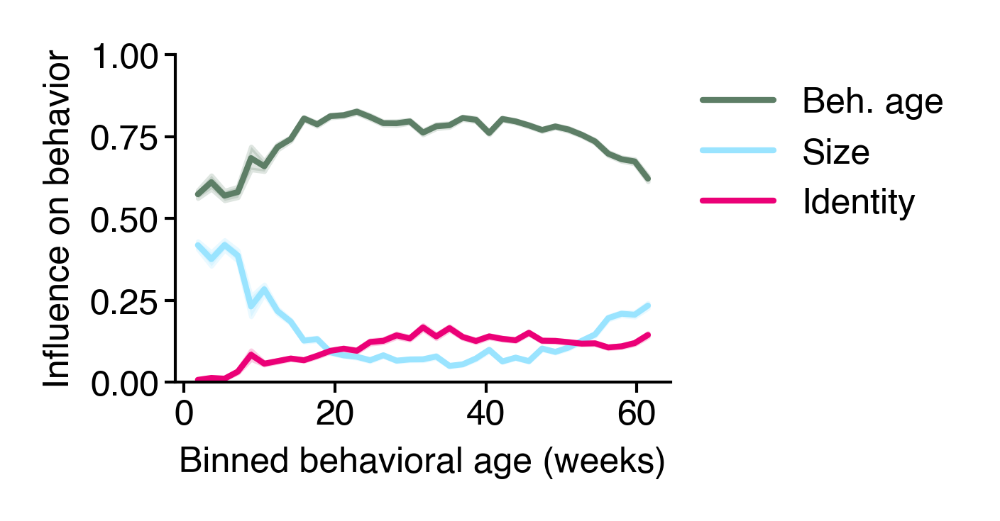

In [96]:
fig = figure(1.5, 1)
ax = sns.lineplot(data=plt_dfs, x='bio_bin', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Binned behavioral age (weeks)", ylabel="Influence on behavior", ylim=(0, 1))
legend()
sns.despine()
# saver(fig, 'longtogeny-component-influence-on-behavior');

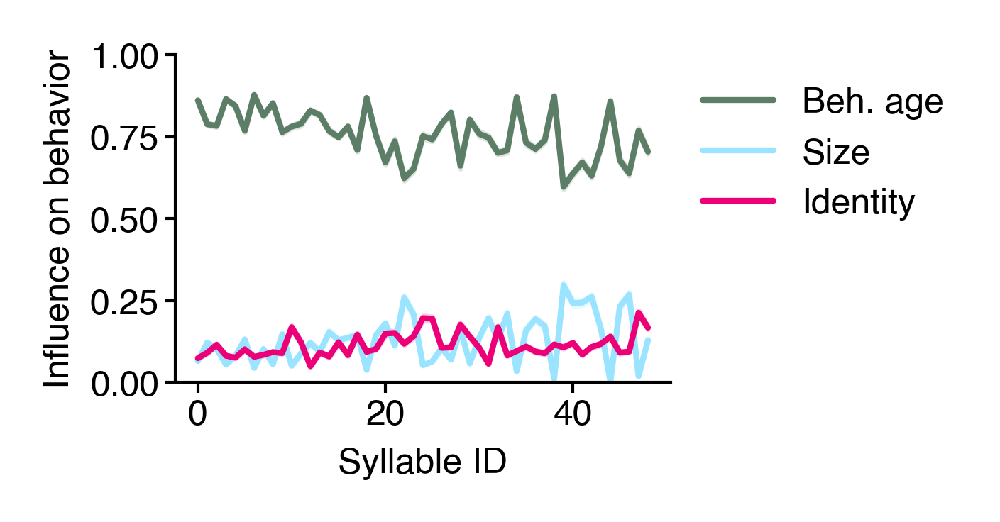

In [97]:
fig = figure(1.5, 1)
ax = sns.lineplot(data=plt_dfs, x='syllable', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Syllable ID", ylabel="Influence on behavior", ylim=(0, 1))
legend()
sns.despine()
# saver(fig, 'longtogeny-syllables-component-influence-on-behavior');

In [98]:
# rank-order influences
tmp = plt_dfs.groupby(['syllable', 'type'])[['influence']].mean()
ranks = tmp.groupby('type').rank().reset_index()

In [99]:
mp = ranks.query('type == "Identity"').set_index('syllable')['influence']

In [100]:
ranks['color'] = ranks['syllable'].map(mp)

[0, 1]


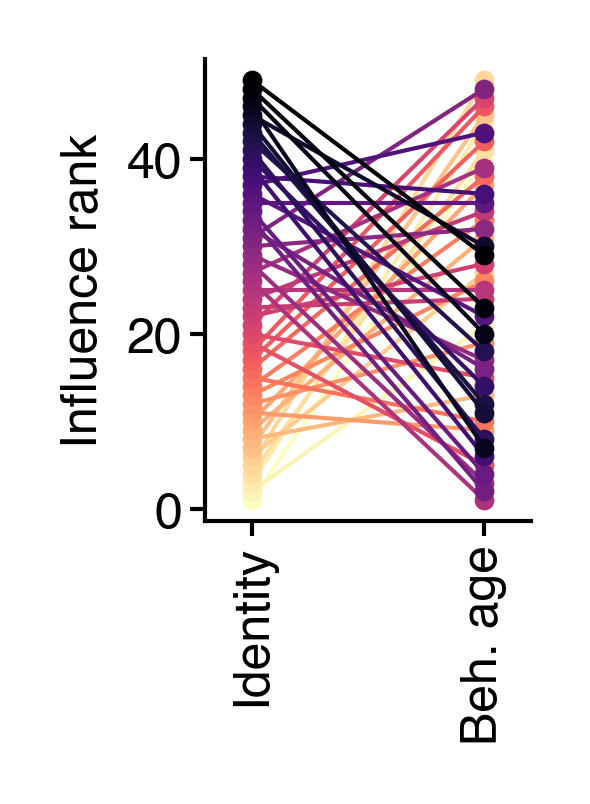

In [101]:
fig = figure(0.7, 1)
ax = sns.pointplot(
    data=ranks,
    x="type",
    y="influence",
    hue="color",
    palette="magma_r",
    order=["Identity", "Beh. age"],
    legend=False,
    markersize=2,
    linewidth=0.5
)
ax.set(xlabel="", xlim=(-0.2, 1.2), ylabel="Influence rank")
plt.xticks(rotation=90)
print(ax.get_xticks())
sns.despine()
# saver(fig, "longtogeny-rank-order-influence");

Text(0.5, 0, 'Session (sorted by mouse / bio age)')

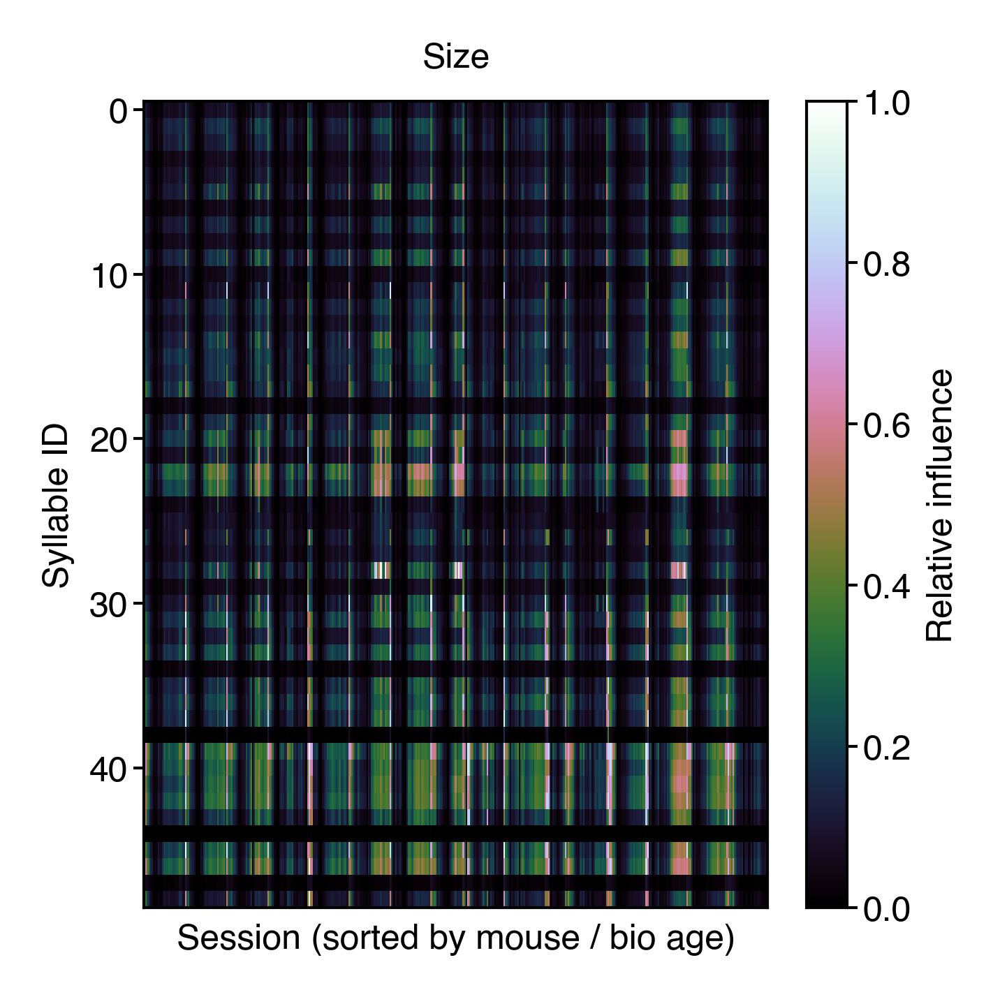

In [102]:
fig = figure(2.4, 2.5)
plt.imshow(size, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Size")
plt.xlabel("Session (sorted by mouse / bio age)")
# saver(fig, "longtogeny-size-influence-matrix");

Text(0.5, 0, 'Session (sorted by mouse / bio age)')

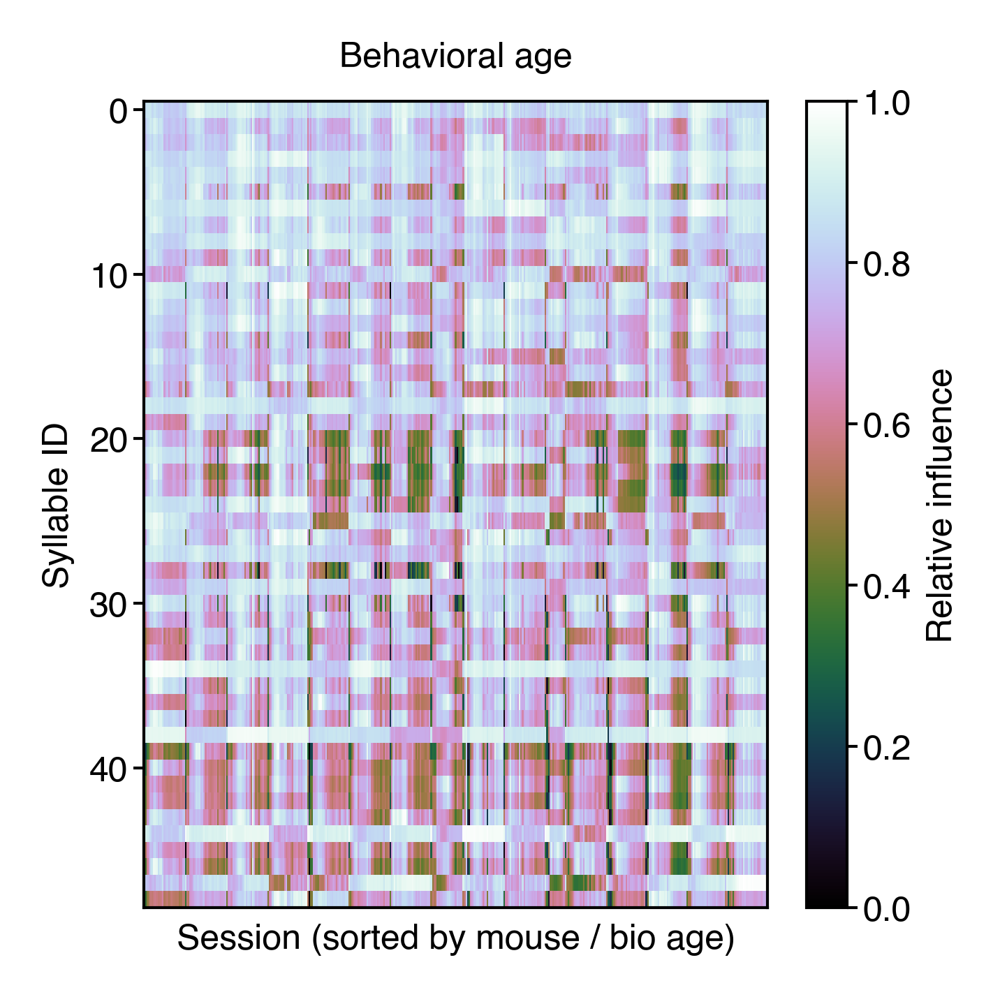

In [103]:
fig = figure(2.4, 2.5)
plt.imshow(bio, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Behavioral age")
plt.xlabel("Session (sorted by mouse / bio age)")
# saver(fig, "longtogeny-beh-age-influence-matrix");

Text(0.5, 0, 'Session (sorted by mouse / bio age)')

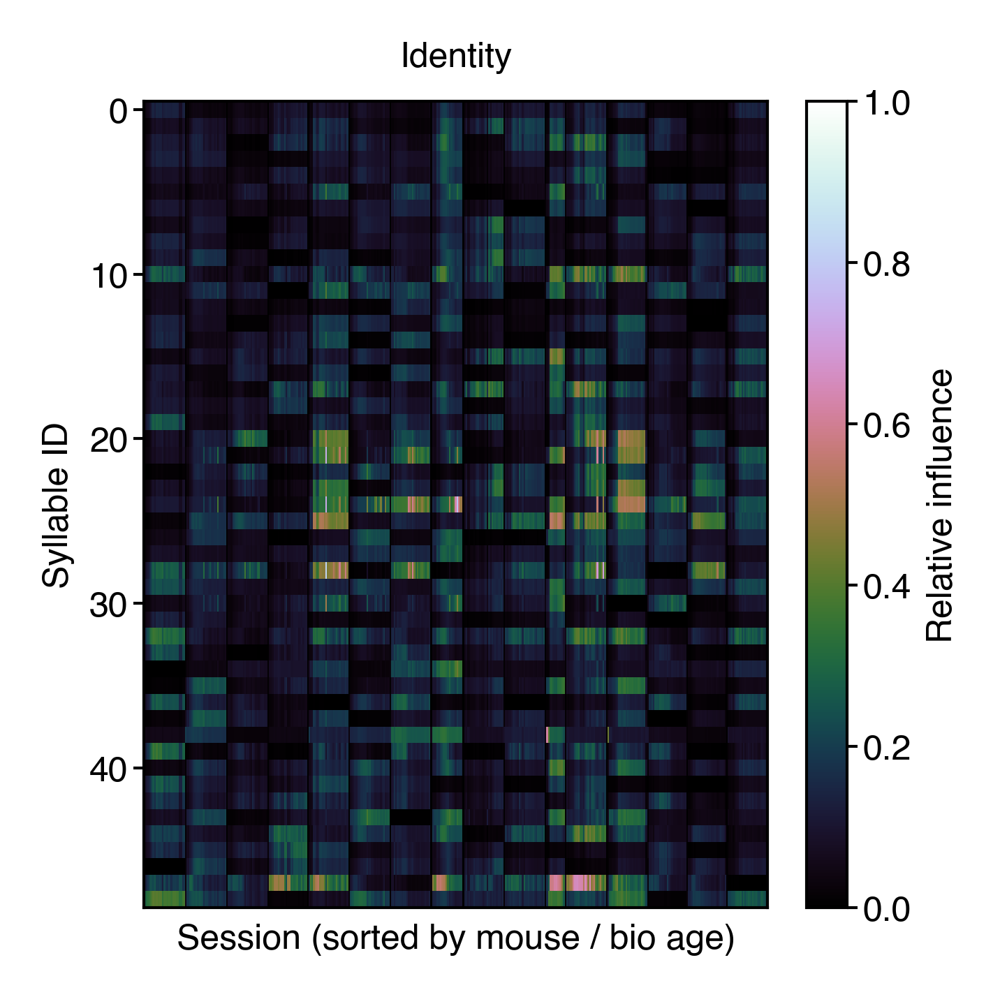

In [104]:
fig = figure(2.4, 2.5)
plt.imshow(indiv, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Identity")
plt.xlabel("Session (sorted by mouse / bio age)")
# saver(fig, "longtogeny-indiv-influence-matrix");

## Ontogeny male vs female? or Long v2 male/female?

In [105]:
def read_female_ontogeny(use_syllables=None):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_females_relabeled_counts_matrix_v00.parquet"
    )
    df = df.sort_index(axis=1)
    df = df.query('age < 100')
    
    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_females_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)
    
    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]

    if use_syllables is None:
        avg_age_usages = df.groupby('age', observed=True).mean()
        syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
        print(syll_mask.sum(), 'syllables')
        
        df = df.loc[:, syll_mask]
    
        female_sylls = syll_mask.index[syll_mask]
    else:
        df = df[use_syllables]
        female_sylls = None
    return df, sizes_col, female_sylls

In [106]:
def read_male_ontogeny(use_syllables=None):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_relabeled_counts_matrix_v00.parquet"
    )
    df = df.sort_index(axis=1)
    df = df.query('age < 100')
    
    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)
    
    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]

    if use_syllables is None:
        avg_age_usages = df.groupby('age', observed=True).mean()
        syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
        print(syll_mask.sum(), 'syllables')
        
        df = df.loc[:, syll_mask]
        
        male_sylls = syll_mask.index[syll_mask]
    else:
        df = df[use_syllables]
        male_sylls = None
    return df, sizes_col, male_sylls

In [107]:
df, sizes_col, male_sylls = read_male_ontogeny()
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

56 syllables


In [108]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 20,  # weeks
    # "bio_params_sd": 3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
    "rw_sd": 100,
}

In [109]:
keep_keys = ['heldout_ll', 'heldout_r2_total', 'heldout_r2_total_v3', 'true_ages', 'bio_ages']

In [ ]:
outs = []

for n_splines in tqdm(range(4, 9)):

    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 2, n_repeats=7)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "n_splines": n_splines,
            "age_sd": age_sd,
            **v
        })
outs_df = pd.DataFrame(outs)

In [ ]:
figure(1, 1.25)
ax = sns.lineplot(
    data=outs_df,
    x="n_splines",
    y="heldout_ll",
    errorbar="se",
    err_kws=dict(lw=0),
    color="k",
)
ax.set(ylabel="Heldout LL", xlabel="Num. splines", xlim=(4, None))
sns.despine()

In [112]:
outs = []
hypparams["n_splines"] = 4

for  age_sd in tqdm(range(1, 35, 3)):

    hypparams["age_sd"] = float(age_sd)

    tmp = masked_xval(features, hypparams, 2, n_repeats=7)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "age_sd": age_sd,
            **v
        })
outs_df = pd.DataFrame(outs)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

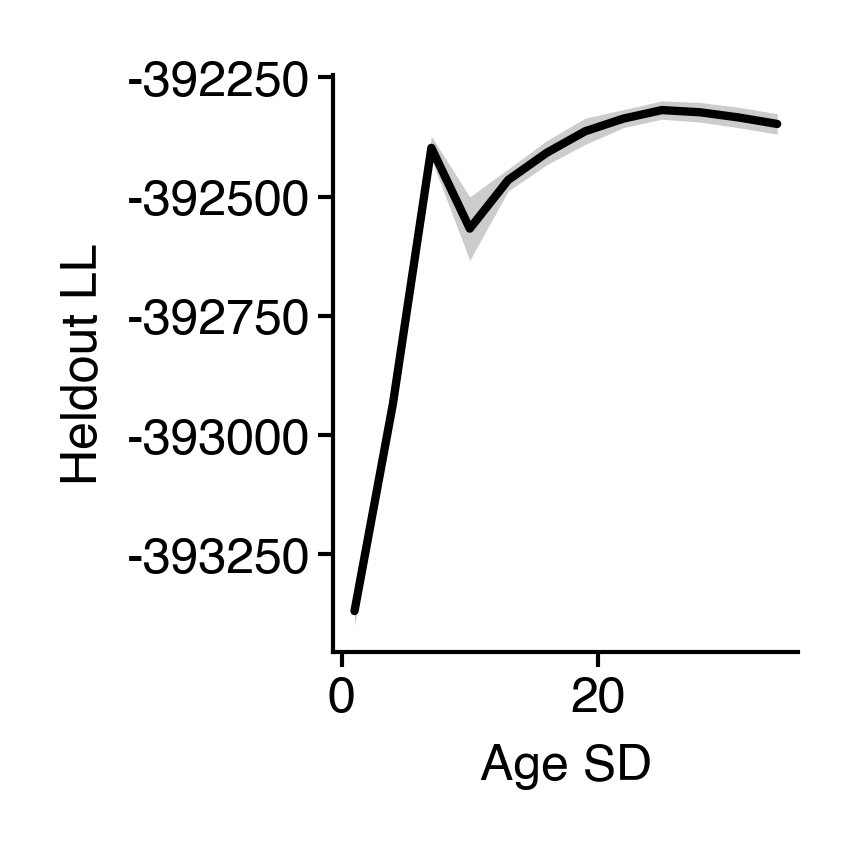

In [113]:
figure(1, 1.25)
ax = sns.lineplot(
    data=outs_df,
    x="age_sd",
    y="heldout_ll",
    errorbar="se",
    err_kws=dict(lw=0),
    color="k",
)
ax.set(ylabel="Heldout LL", xlabel="Age SD")
sns.despine()

## Fit to males, apply to females

In [114]:
df, sizes_col, male_sylls = read_male_ontogeny()
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

56 syllables


In [115]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 20,  # weeks
    # "bio_params_sd": 3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
    "rw_sd": 100,
}

In [116]:
males = masked_xval(features, hypparams, 2, n_repeats=20)

  0%|          | 0/20 [00:00<?, ?it/s]

In [117]:
df, sizes_col, _ = read_female_ontogeny(male_sylls)
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [119]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 20,  # weeks
    # "bio_params_sd": 3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
    "rw_sd": 100,
}

In [120]:
def process_heldout_data(params, components, features, hypparams, model_version=2, rng=None):
    if rng is None:
        rng = np.random.RandomState(3)
    bio_ages = get_biological_age(
        params,
        components.bases,
        components.age_samples,
        components.true_age,
        features["counts"],
        hypparams,
        components.age_unnormalizer,
        globals()[f'model_fun_v{model_version}'],
    )
    concentrations, concentration_components = compute_concentrations(params, model_version, components)

    norm_bio_age = components.age_normalizer(bio_ages)

    concs = []
    for i in range(len(norm_bio_age)):
        idx = i if len(concentrations) > 1 else 0
        _concs = concentration_interpolation(norm_bio_age[idx], concentrations[idx])
        concs.append(_concs)
    concs = jnp.array(concs)

    total_counts = features["counts"].sum(axis=1)
    predicted_counts = expected_counts(concs, total_counts)

    hypparams["mask"], hypparams["heldout_mask"] = create_masks(
        hypparams["n_keep_sylls"],
        hypparams["n_syllables"],
        hypparams["n_sessions"],
        rng,
    )

    r2s, weighted_r2 = compute_heldout_r2(features["counts"], predicted_counts, hypparams["heldout_mask"])

    return dict(bio_ages=bio_ages, predicted_counts=predicted_counts, r2s=r2s, weighted_r2=weighted_r2)

In [121]:
female_components = model_setup(
    features, hypparams, 2
)

rng = np.random.RandomState(3)

female_heldout_r2s = []
for i in tqdm(males):
    male_params = males[i]['params']
    female_from_male_model = process_heldout_data(male_params, female_components, features, hypparams, model_version=2, rng=rng)
    female_heldout_r2s.append(female_from_male_model['weighted_r2'])

  0%|          | 0/20 [00:00<?, ?it/s]

<Axes: ylabel='Count'>

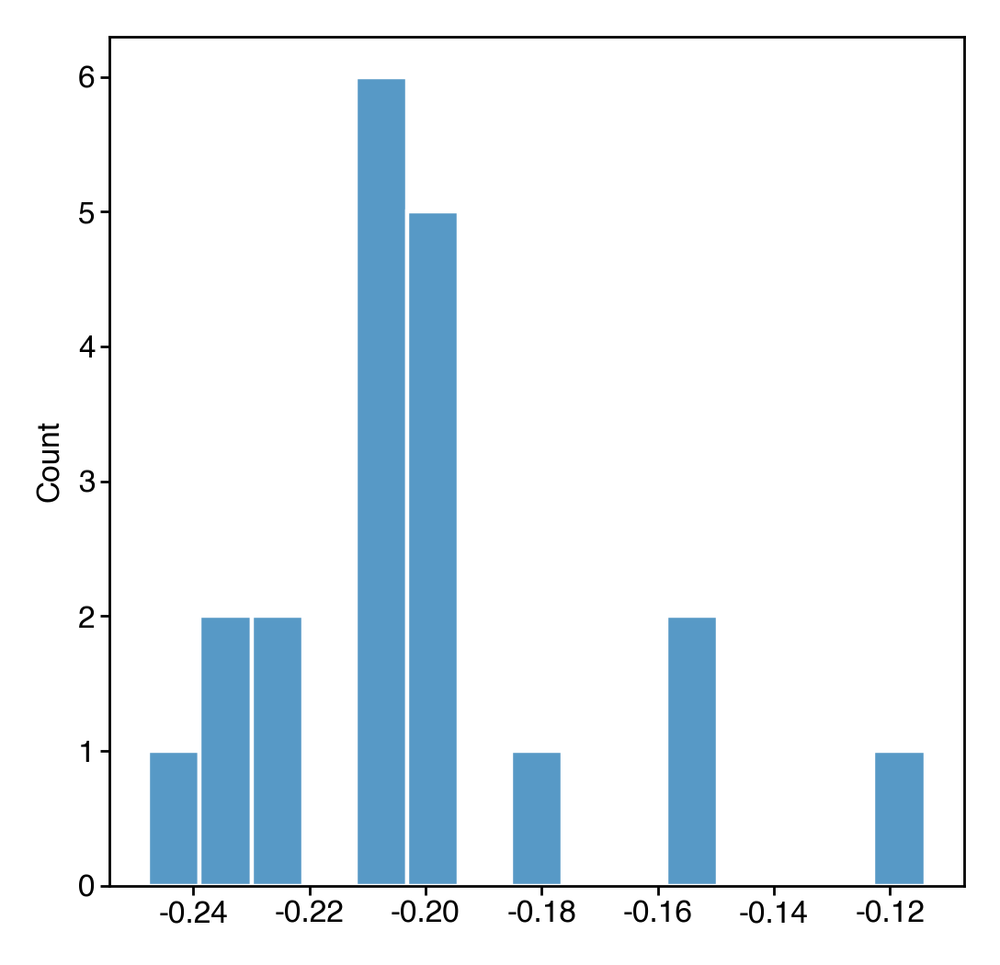

In [122]:
sns.histplot(female_heldout_r2s)

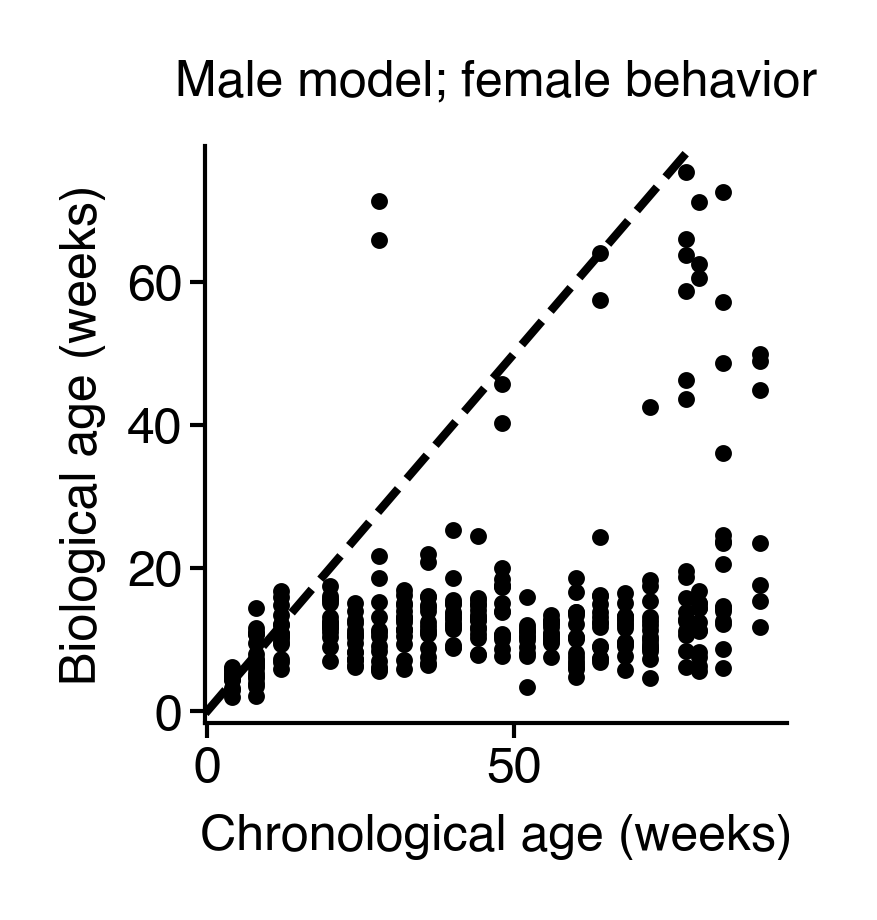

In [123]:
fig = figure(1.25, 1.25)
ax = fig.gca()
ax.scatter(female_components.age_unnormalizer(female_components.true_age), female_from_male_model['bio_ages'], s=1.5, color='k')
add_identity(ax, color='k', ls='--', zorder=-1)
ax.set(xlabel="Chronological age (weeks)", ylabel="Biological age (weeks)", title="Male model; female behavior")
sns.despine()
# saver(fig, "ontogeny-female-bio-age-from-male-model");

In [ ]:
# bio_age_samples = [pd.Series(v['bio_ages'], index=df.index) for v in males.values()]
# bio_age_samples = pd.DataFrame(bio_age_samples).T
# bio_age_samples.to_parquet('/n/scratch/users/w/wg41/bio-age-model/ontogeny-predictions.parquet')

## Fit to females, apply to males

In [125]:
df, sizes_col, female_sylls = read_female_ontogeny()

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

49 syllables


In [126]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 20,  # weeks
    # "bio_params_sd": 3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
    "rw_sd": 100,
}

In [127]:
females = masked_xval(features, hypparams, 2, n_repeats=20)

  0%|          | 0/20 [00:00<?, ?it/s]

In [128]:
df, sizes_col, _ = read_male_ontogeny(female_sylls)

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [129]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 20,  # weeks
    # "bio_params_sd": 3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
    "use_rw_prior": False,
    "rw_sd": 100,
}

In [130]:
male_components = model_setup(
    features, hypparams, 2
)

rng = np.random.RandomState(3)

male_heldout_r2s = []
for i in tqdm(females):
    female_params = females[i]['params']
    male_from_female_model = process_heldout_data(female_params, male_components, features, hypparams, model_version=2, rng=rng)
    male_heldout_r2s.append(male_from_female_model['weighted_r2'])

  0%|          | 0/20 [00:00<?, ?it/s]

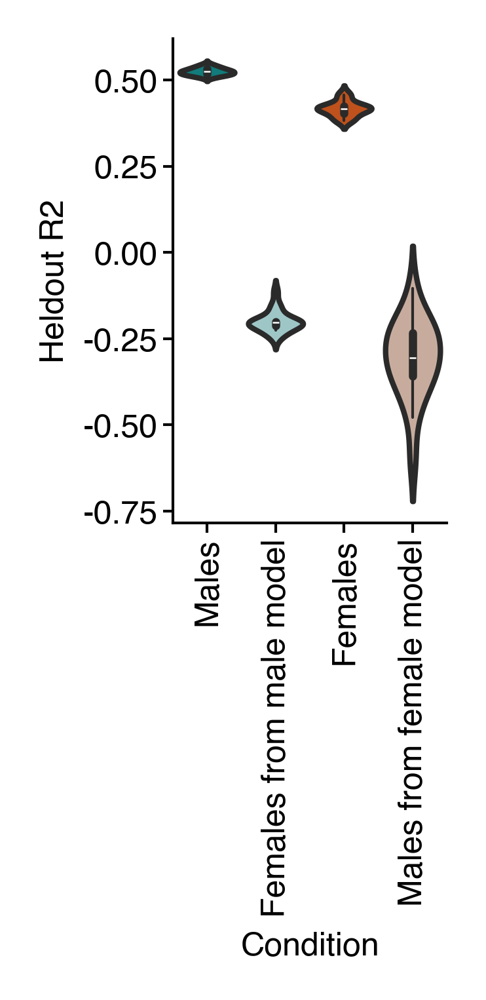

In [131]:
y = dict(
    male=list(pluck('heldout_r2_total_v3', males.values())),
    female_on_male=female_heldout_r2s,
    female=list(pluck('heldout_r2_total_v3', females.values())),
    male_on_female=male_heldout_r2s,
)

female_color = '#d94801'
male_color = '#008C8D'

fig = figure(0.9, 1.6)
ax = sns.violinplot(
    data=y,
    palette=[
        male_color,
        sns.set_hls_values(male_color, s=0.35, l=0.7),
        female_color,
        sns.set_hls_values(female_color, s=0.35, l=0.7),
    ],
    inner_kws=dict(box_width=1.5, linewidth=1),
)
ax.set(ylabel="Heldout R2", xlabel='Condition')
plt.xticks(range(4), labels=["Males", "Females from male model", "Females", "Males from female model"], rotation=90)
sns.despine()
# saver(fig, 'ontogeny-male-female-heldout-r2s');

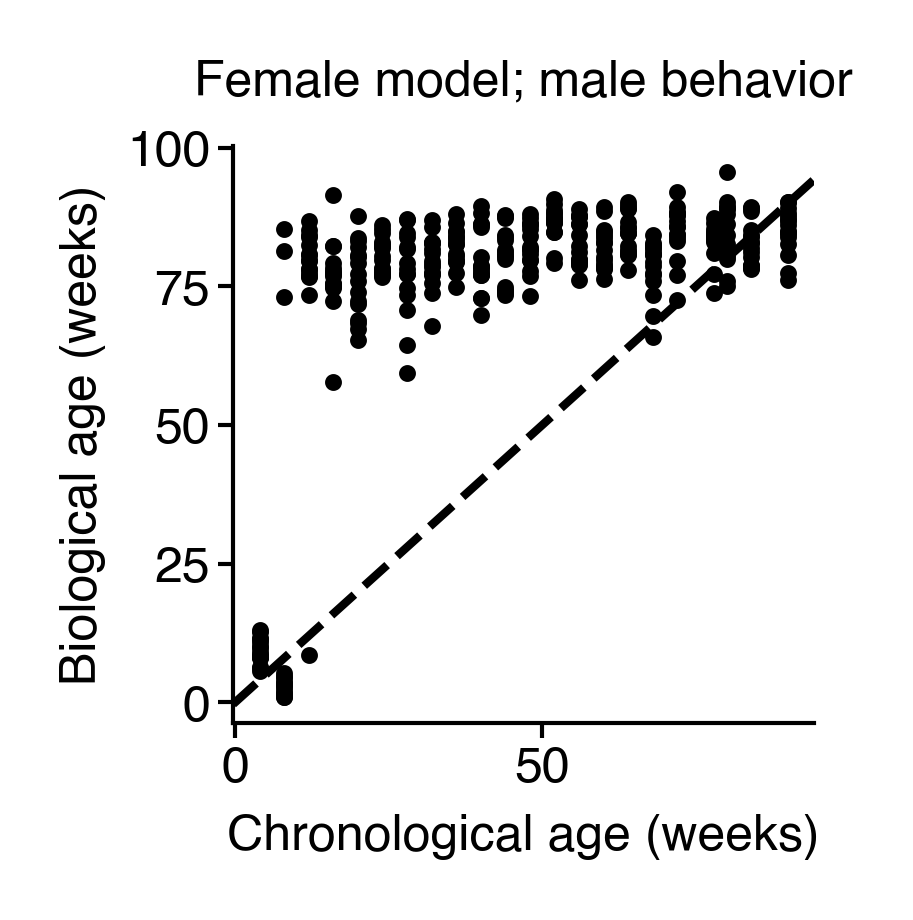

In [132]:
fig = figure(1.25, 1.25)
ax = fig.gca()
ax.scatter(male_components.age_unnormalizer(male_components.true_age), male_from_female_model['bio_ages'], s=1.5, color='k')
add_identity(ax, color='k', ls='--', zorder=-1)
ax.set(xlabel="Chronological age (weeks)", ylabel="Biological age (weeks)", title="Female model; male behavior")
sns.despine()
# saver(fig, "ontogeny-male-bio-age-from-female-model");

## Compare male and female fits

In [133]:
avg_total_male_counts = males[0]['counts'].sum(1).mean()
plt_age = male_components.age_unnormalizer(male_components.age_samples)

In [134]:
female_color = '#d94801'
male_color = '#008C8D'

In [135]:
male_sylls

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 44, 45, 47, 49, 50, 51, 54, 55, 58, 59, 64, 66,
       67, 71],
      dtype='int64')

In [136]:
female_sylls

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 38, 39,
       40, 42, 44, 46, 48, 50, 56, 59, 61, 62, 67, 71, 76],
      dtype='int64')

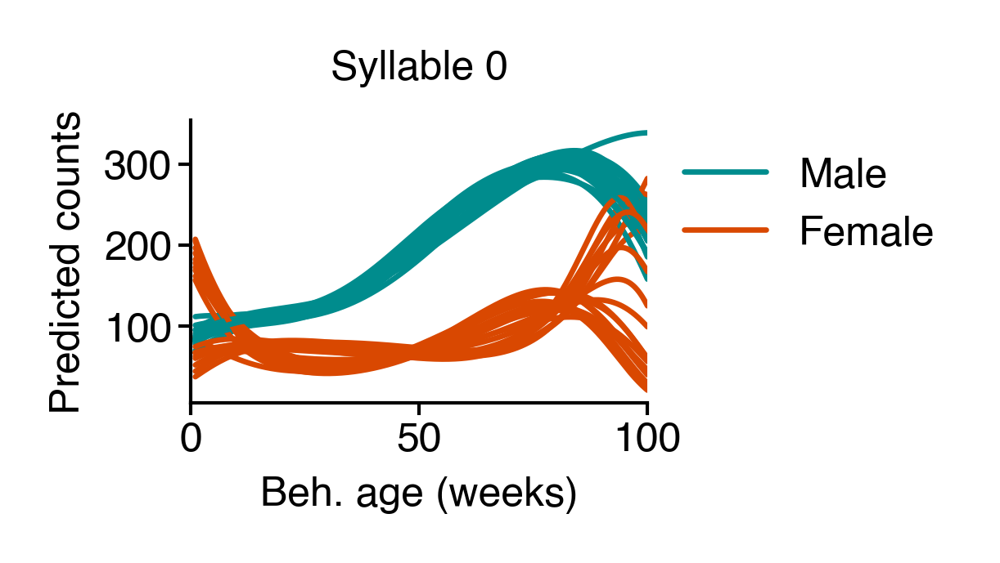

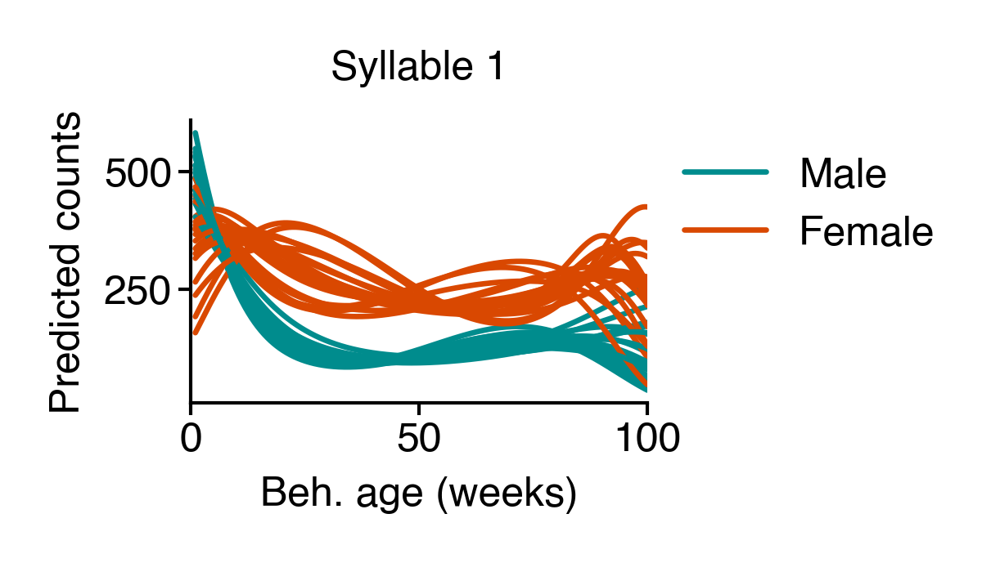

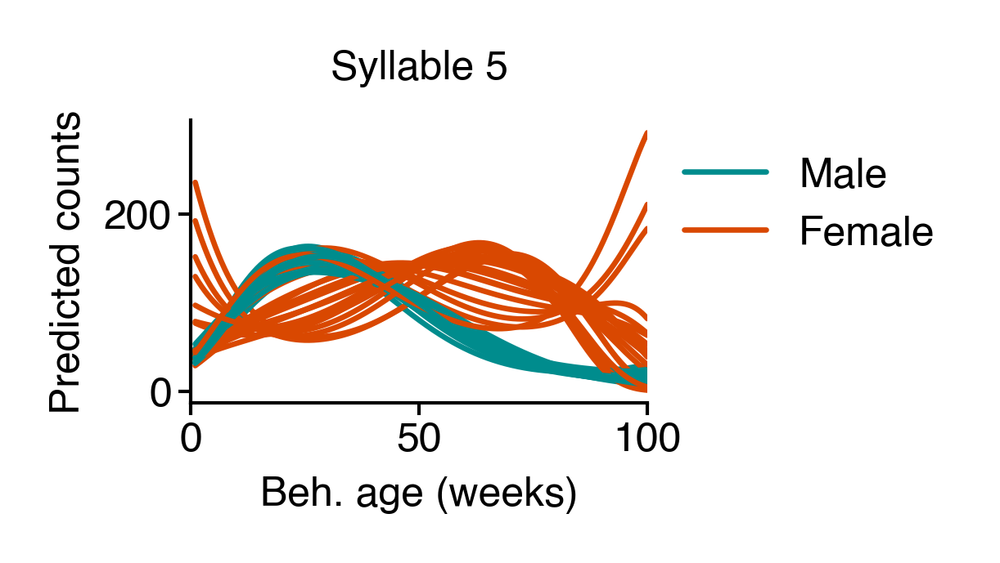

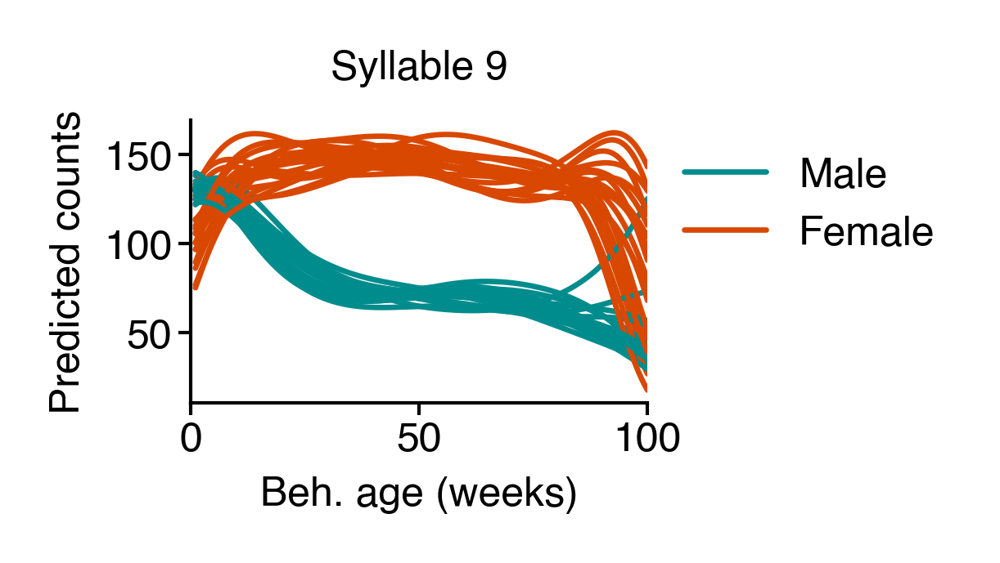

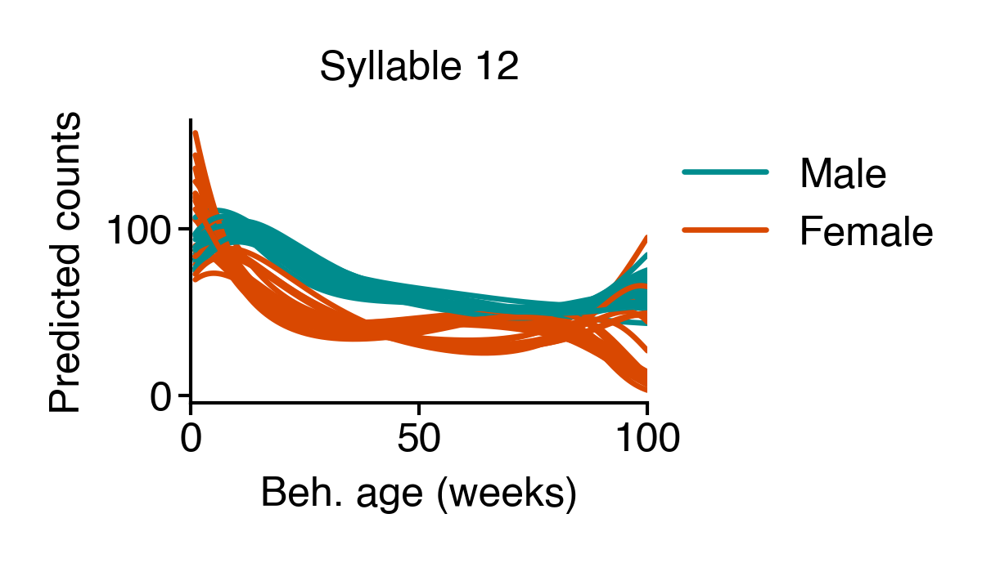

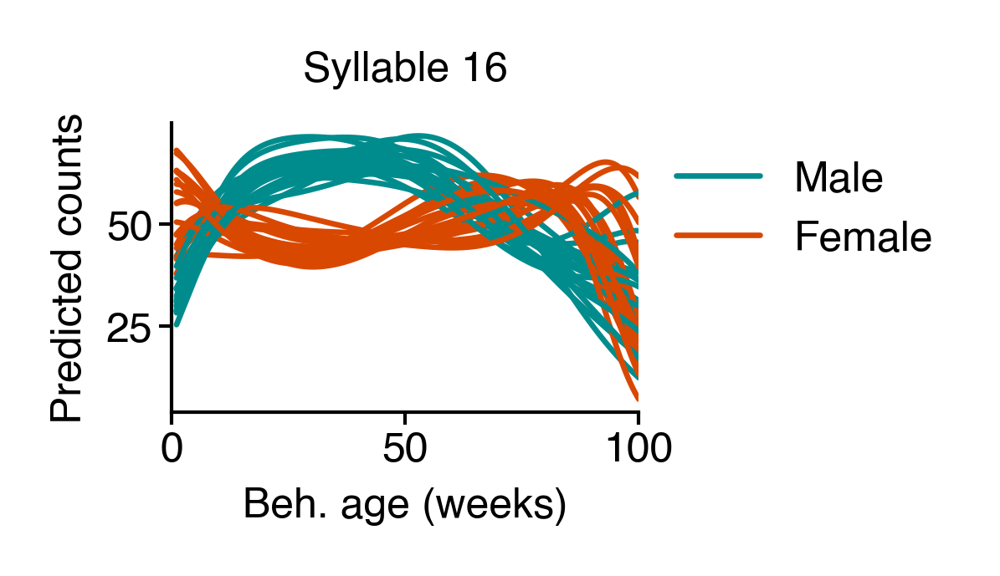

In [137]:
syllable_list = [0, 1, 5, 9, 12, 16]
# for i in range(30):
for i in syllable_list:
    fig = figure(1.2, 0.75)
    ax = fig.gca()
    for j in males:
        male_conc = males[j]["concentrations"].mean(0)
        female_conc = females[j]["concentrations"].mean(0)
        male_expected_counts = expected_counts(
            male_conc, np.array([avg_total_male_counts] * len(male_conc))
        )
        female_expected_counts = expected_counts(
            female_conc, np.array([avg_total_male_counts] * len(female_conc))
        )
        ax.plot(
            plt_age,
            male_expected_counts[:, i],
            label="Male" if j == 0 else None,
            c=male_color,
            lw=0.8,
        )
        ax.plot(
            plt_age,
            female_expected_counts[:, i],
            label="Female" if j == 0 else None,
            c=female_color,
            lw=0.8,
        )
    legend()
    ax.set(
        title=f"Syllable {i}",
        xlabel="Beh. age (weeks)",
        ylabel="Predicted counts",
        xlim=(0, 100),
    )
    sns.despine()
    plt.show()
    # saver(fig, f"male-v-female-predicted-counts-syllable-{i}");

## Gridsearch parameters for ontogeny model
- n splines
- age sd
- l2 prior

In [96]:
df, sizes_col, male_sylls = read_male_ontogeny()
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

56 syllables


In [100]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 19,  # weeks
    "bio_params_sd": 0.3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 5,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 250,
}

In [101]:
# l2_prior = [1e-3, 1e-2, 1e-1, 2e-1, 3e-1, 5e-1, 1, 3, 5, 10, 100]
l2_prior = [1e-3, 3e-1, 1, 10, 100]

age_sd = np.arange(1, 42, 10)

n_splines = range(4, 18, 3)

In [103]:
import joblib

In [110]:
from toolz import drop

In [111]:
for i, (_n_splines, _age_sd, _l2_prior) in drop(79, enumerate(
    tqdm(list(product(n_splines, age_sd, l2_prior)))
)):
    hypparams["n_splines"] = _n_splines
    hypparams["age_sd"] = float(_age_sd)
    hypparams["bio_params_sd"] = _l2_prior
    try:
        tmp = masked_xval(features, hypparams, 2, n_repeats=4)
        for v in tmp.values():
            v["init_components"].age_normalizer = None
            v["init_components"].age_unnormalizer = None
        tmp["grid_params"] = keyfilter(
            lambda k: k in ["n_splines", "age_sd", "bio_params_sd"], hypparams
        )
        joblib.dump(
            tmp,
            f"/n/scratch/users/w/wg41/bio-age-model/ontogeny-gridsearch-2024-04-03-iter-{i:03d}.p",
        )
    except ValueError:
        continue

  0%|          | 0/125 [00:00<?, ?it/s]

19656
19656


In [112]:
import random

In [113]:
l2_prior = [1e-3, 1e-2, 1e-1, 2e-1, 3e-1, 5e-1, 1, 3, 5, 10, 100]
# l2_prior = [1e-3, 3e-1, 1, 10, 100]

age_sd = np.arange(9, 28, 3)

n_splines = range(4, 10, 1)

In [114]:
random.seed(0)
grid = list(product(n_splines, age_sd, l2_prior))
random.shuffle(grid)

for i, (_n_splines, _age_sd, _l2_prior) in enumerate(
    tqdm(grid)
):
    hypparams["n_splines"] = _n_splines
    hypparams["age_sd"] = float(_age_sd)
    hypparams["bio_params_sd"] = _l2_prior
    try:
        tmp = masked_xval(features, hypparams, 2, n_repeats=4)
        for v in tmp.values():
            v["init_components"].age_normalizer = None
            v["init_components"].age_unnormalizer = None
        tmp["grid_params"] = keyfilter(
            lambda k: k in ["n_splines", "age_sd", "bio_params_sd"], hypparams
        )
        joblib.dump(
            tmp,
            f"/n/scratch/users/w/wg41/bio-age-model/ontogeny-high-resolution-gridsearch-2024-04-03-iter-{i:03d}.p",
        )
    except ValueError:
        continue

  0%|          | 0/462 [00:00<?, ?it/s]